In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy
import anndata as ad
import hdf5plugin
from sklearn.decomposition import TruncatedSVD
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import rcParams
import os 
#external modules
import scanpy.external as sce
#pretty plotting
import seaborn as sb
import sys 
sb.set_context(context='poster')

import copy

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80)

scanpy==1.9.3 anndata==0.9.2 umap==0.5.3 numpy==1.24.4 scipy==1.10.1 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.10.6 louvain==0.8.1 pynndescent==0.5.10


## SECTION I: Data loading
Loading adata information that has been agregated and quality controled

In [3]:
figure_path = r'C:\Users\SingleCellSequencing\scs_analysis\figures'
input_path = r'C:\Users\SingleCellSequencing\scs_analysis\out'

matlab_matrix_path =  r'C:\Users\SingleCellSequencing\scs_analysis\out\control_from_ilona.mat'

adata_path = os.path.join(input_path,'campari_scs_from_R.h5ad')
adata_all_path = os.path.join(input_path,'campari_scs_all_genes_from_R.h5ad')

campari_umap_file = 'control_scs_umap_from_R.h5ad'

NO_PCA = 15


In [4]:
adata = ad.read_h5ad(adata_path)
adata_all = ad.read_h5ad(adata_all_path)

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\anndata\_core\anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\anndata\_core\anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


computing PCA
    on highly variable genes
    with n_comps=15
    finished (0:00:00)


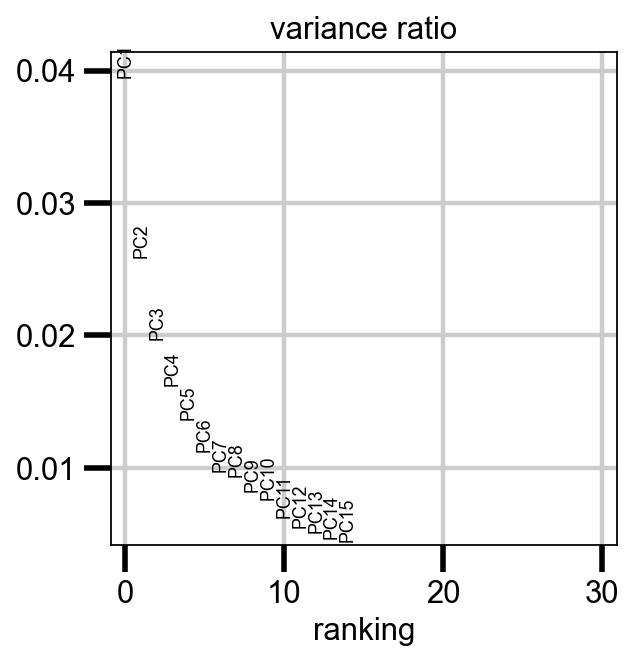

computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing tSNE
    using 'X_pca' with n_pcs = 15
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


In [5]:
### Dimentionality reduction examples using multiple techniques
### Select one number of componets, for example n = 15 and do louvain in the umap transformation 
# with that number of componets
N_selected = NO_PCA
sc.pp.pca(adata, n_comps=N_selected, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata)
sc.pp.neighbors(adata)
sc.tl.tsne(adata)
sc.tl.umap(adata)

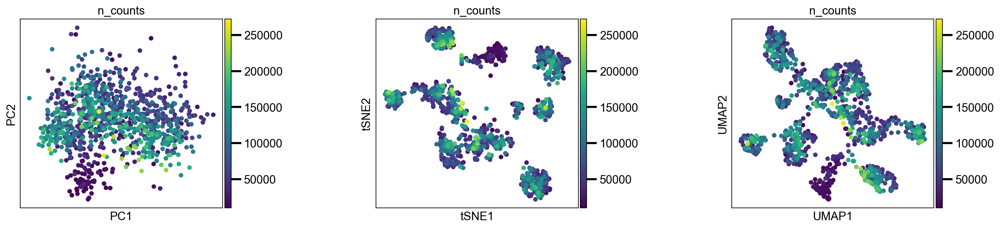

In [6]:
from matplotlib import rcParams

rcParams['figure.figsize']=(20,10)
fig_ind=np.arange(231, 237)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

p10 = sc.pl.pca_scatter(adata, color='n_counts', ax=fig.add_subplot(fig_ind[0]), show=False)
p11 = sc.pl.tsne(adata, color='n_counts', ax=fig.add_subplot(fig_ind[1]), show=False)
p12 = sc.pl.umap(adata, color='n_counts', ax=fig.add_subplot(fig_ind[2]), show=False)

plt.show()

In [7]:
# Perform clustering - using highly variable genes
louvain_paramenters = [0.3,0.5,1,1.5,2,2.5,3,3.5,4,4.5,6]
louvain_names = []
for value in louvain_paramenters:
    louvain_names.append('louvain_r' + str(value))

for value,name in zip(louvain_paramenters,louvain_names):
    sc.tl.louvain(adata, resolution=value, key_added=name)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain_r0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 9 clusters and added
    'louvain_r0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 11 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 11 clusters and added
    'louvain_r1.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 14 clusters and added
    'louvain_r2', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" 

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


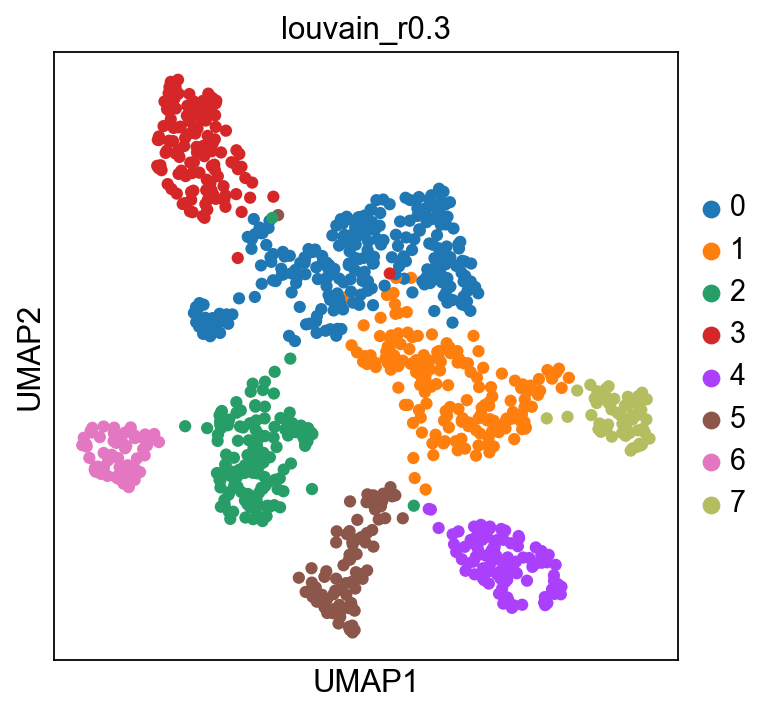

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


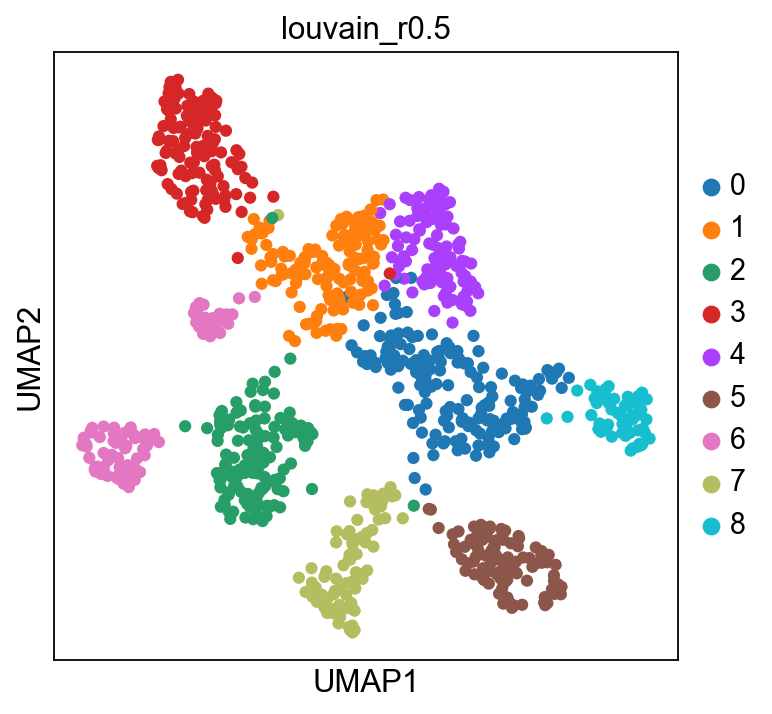

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


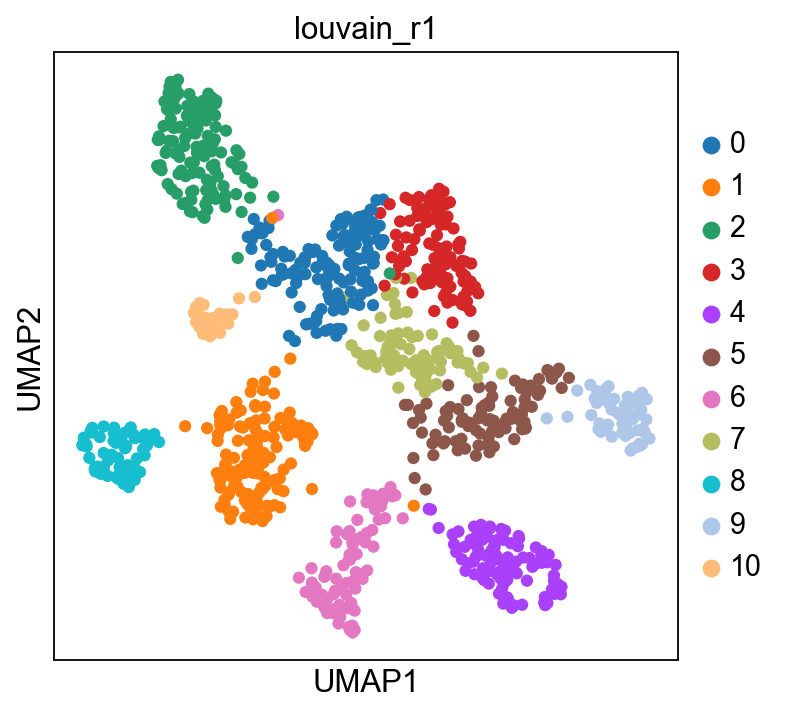

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


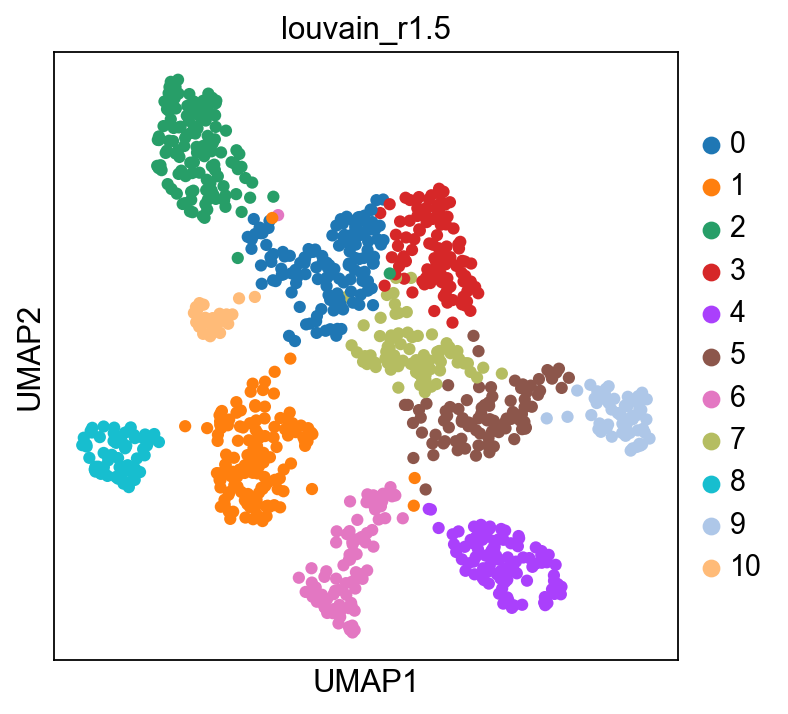

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


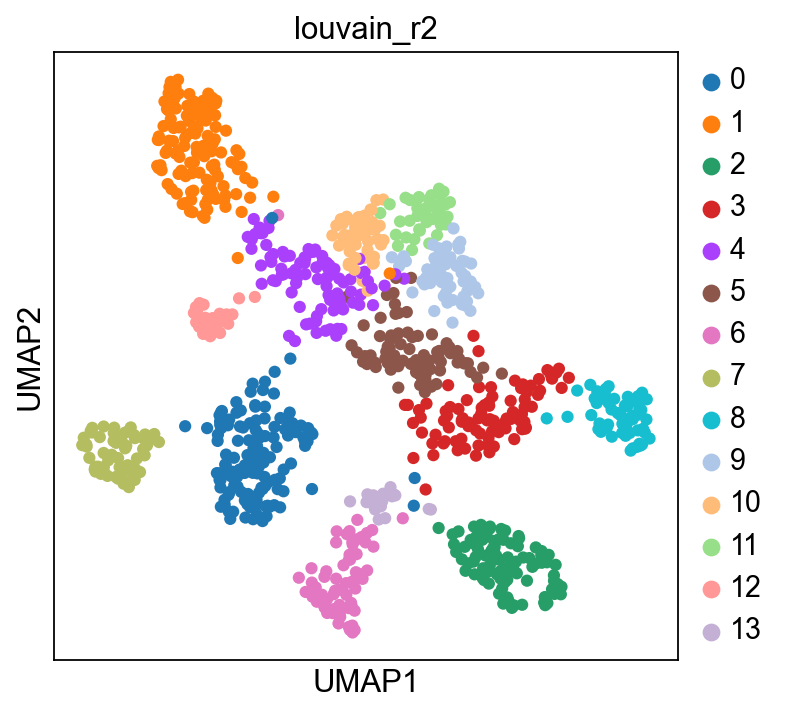

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


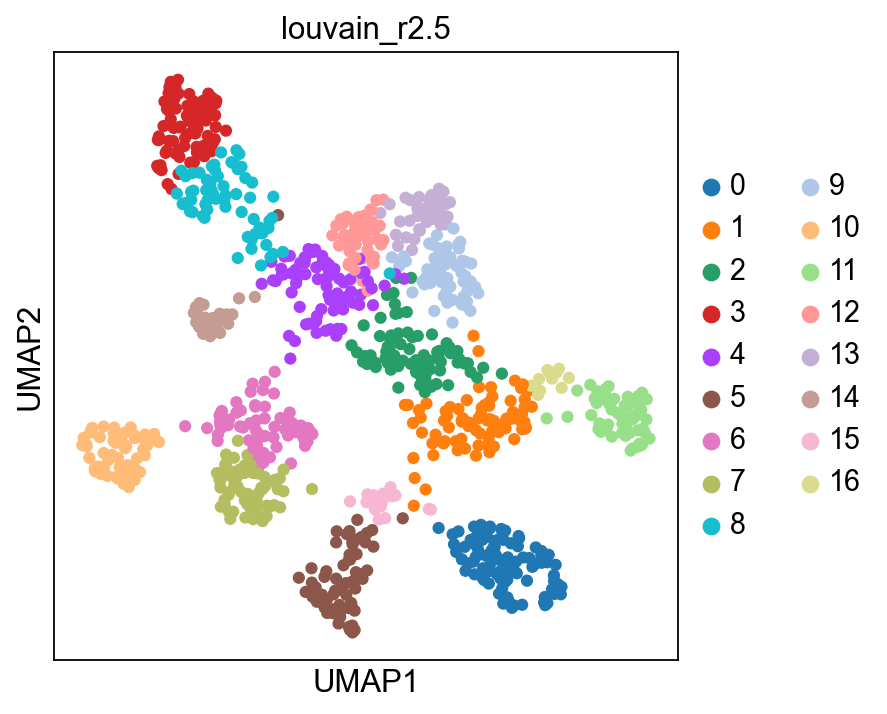

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


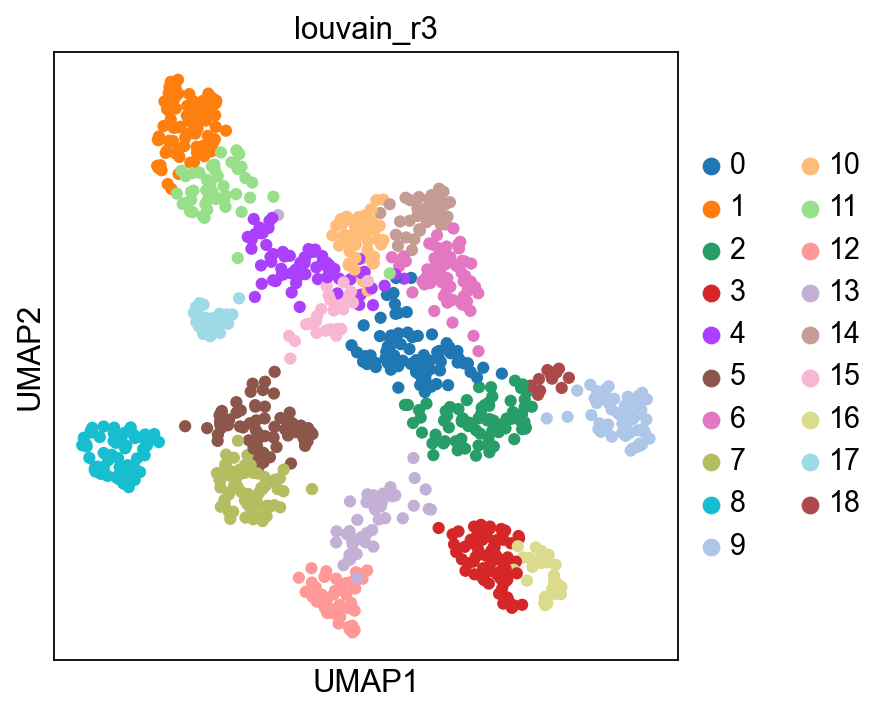

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


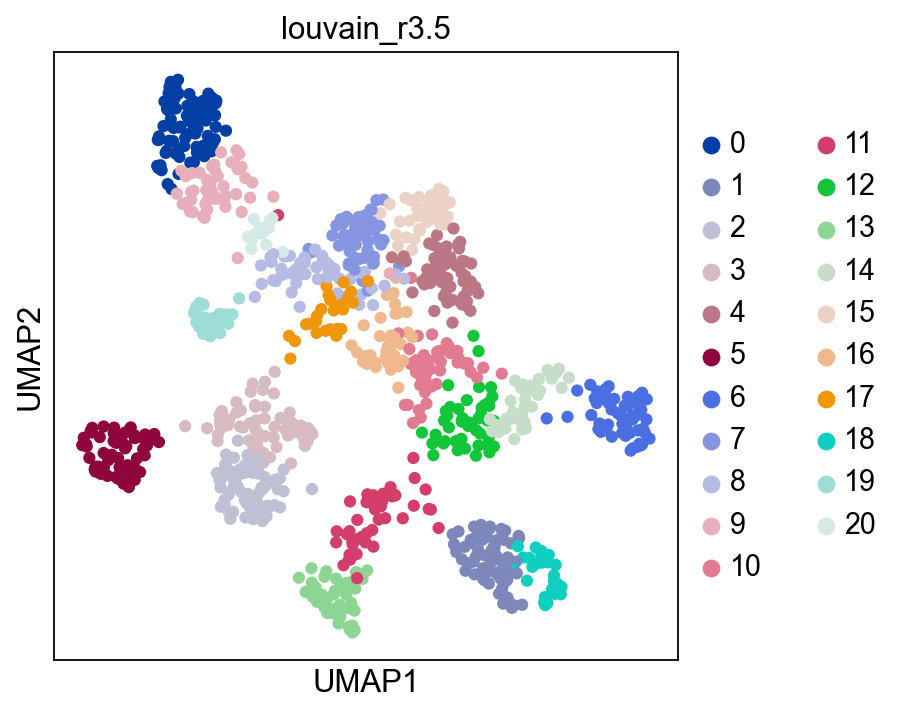

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


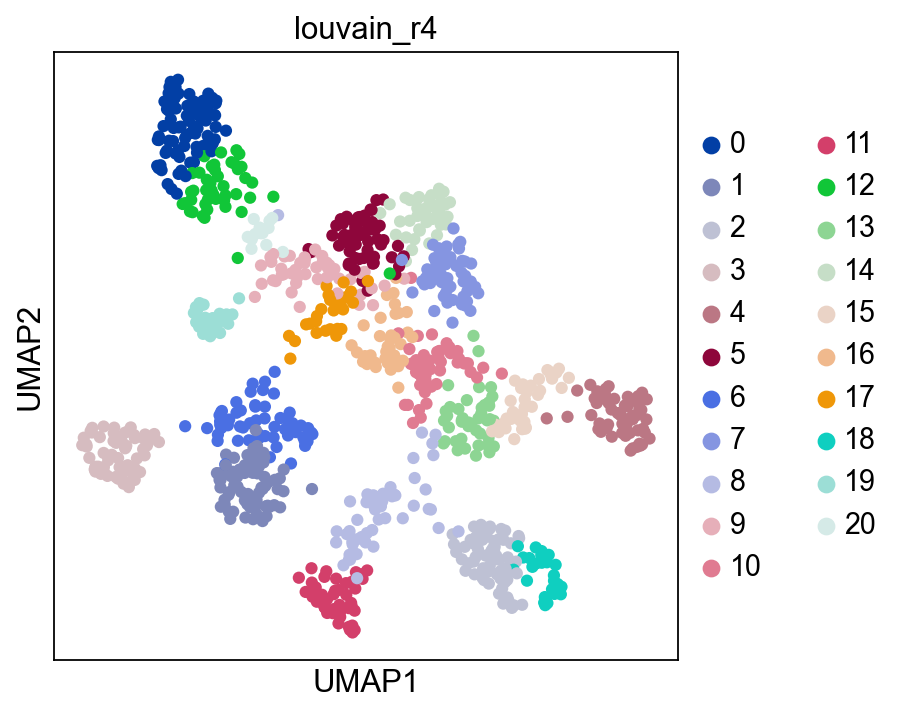

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


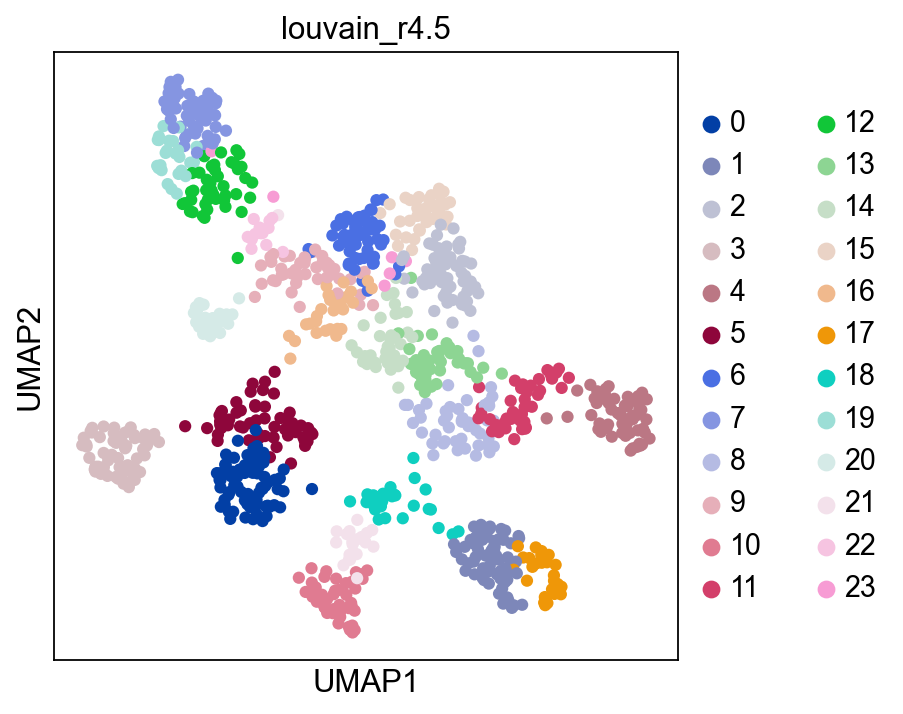

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


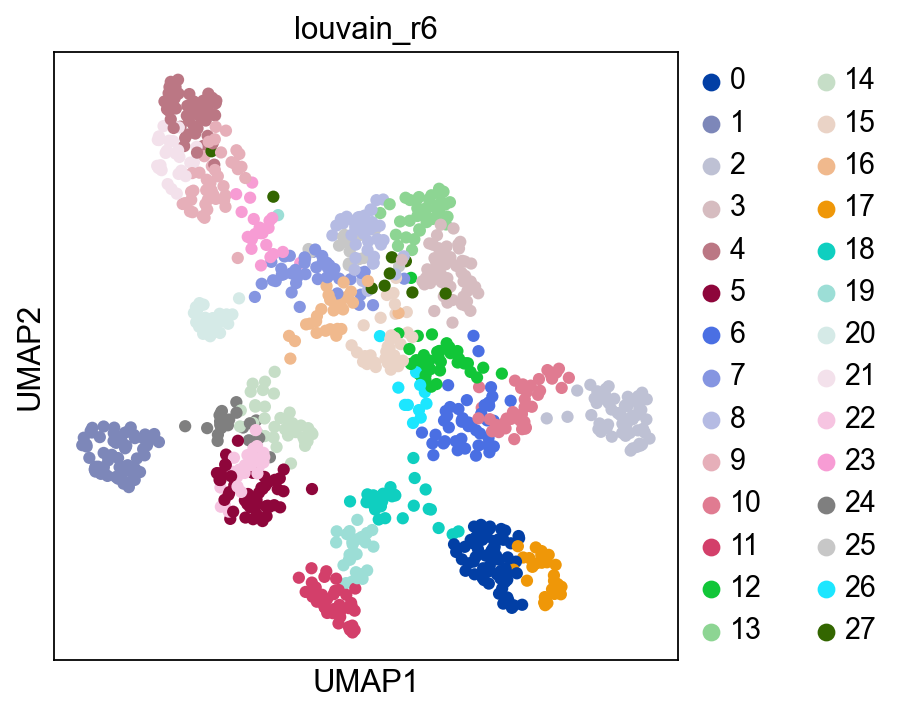

In [8]:
rcParams['figure.figsize']=(5,5)

#Visualize the clustering and how this is reflected by different technical covariates
for name in louvain_names:
    sc.pl.umap(adata, color=name, save = '_louvain_'+name + '.png')

In [9]:
adata

AnnData object with n_obs × n_vars = 989 × 25990
    obs: 'barcode', 'stimulus', 'red', 'green', 'well_id', 'batch', 'n_counts', 'log_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'louvain_r0.3', 'louvain_r0.5', 'louvain_r1', 'louvain_r1.5', 'louvain_r2', 'louvain_r2.5', 'louvain_r3', 'louvain_r3.5', 'louvain_r4', 'louvain_r4.5', 'louvain_r6'
    var: 'gene_id', 'gene_name', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'pca', 'neighbors', 'tsne', 'umap', 'louvain', 'louvain_r0.3_colors', 'louvain_r0.5_colors', 'louvain_r1_colors', 'louvain_r1.5_colors', 'louvain_r2_colors', 'louvain_r2.5_colors', 'louvain_r3_colors', 'louvain_r3.5_colors', 'louvain_r4_colors', 'louvain_r4.5_colors', 'louvain_r6_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [10]:
# save umap data
adata.write_h5ad(
    os.path.join(input_path, campari_umap_file),
#    compression=hdf5plugin.FILTERS["zstd"],
#    compression_opts=hdf5plugin.Zstd(clevel=5).filter_options
)

## SECTION III: Genes exploration 

Here we explore the expression of relevant genes for the experiment. We use the umap projection created in section III and visualize the expresssion of interesting genes. 

In [11]:
### Define list of relevant genes 

marker_genes = ['Trpm3','Piezo2','Trpm2','Smr2','Sstr2','Bmpr1b','Trpm8','Trpv1','Piezo2','Piezo1','Nppb',
                'Sst','Pvalb','Prokr2','Mrgprd','Mrgpra3','Cd34',
                'Th','Trpa1','Ntrk3','Ntrk2','Ntrk1','Ret','Tac1','Calca','Calcb','Nefh',
                'S100b','Scn10a','Slc17a8','Atf3','Pou4f3','Calb1','Calb2','Avil','Asic3',
                'Asic2','Asic1','Pou6f2','Avpr1a','Pou4f2','Sox10','Casq2','Chrna7','Chrna3',
                'P2rx3','Gfra2','Ldhb','Necab2','Spp1','Adm','Hpse']

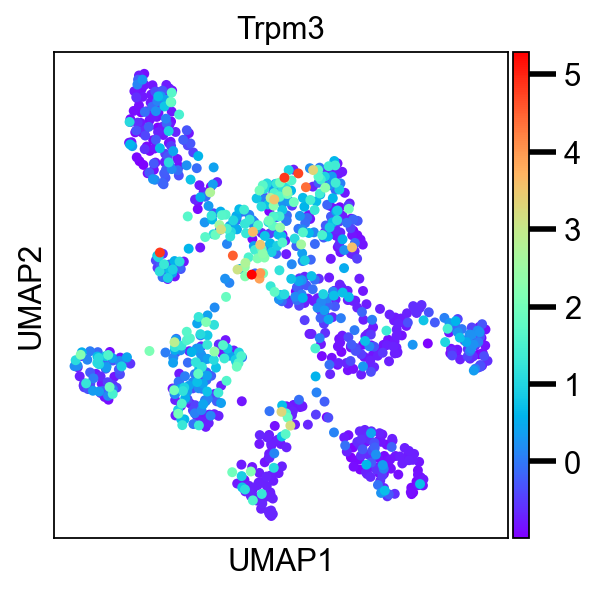

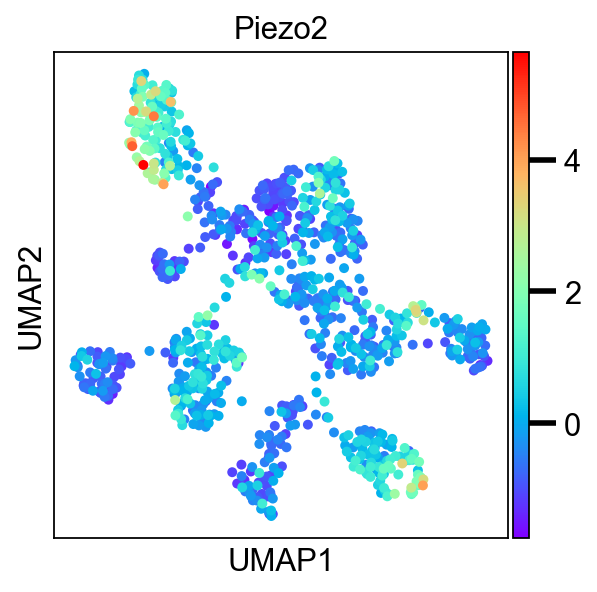

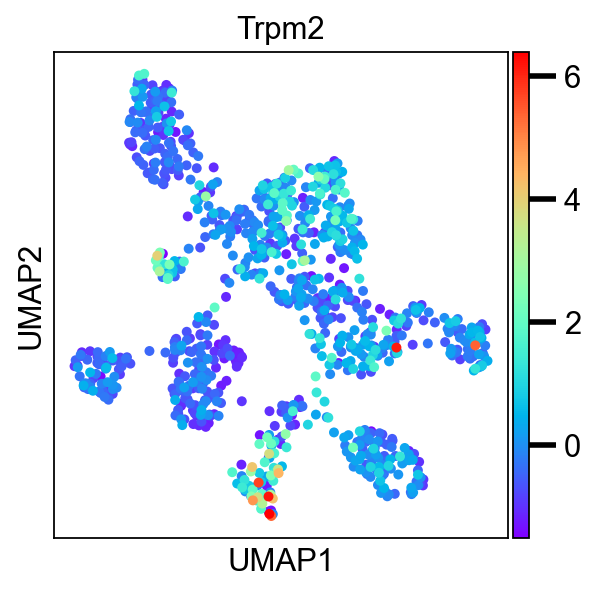

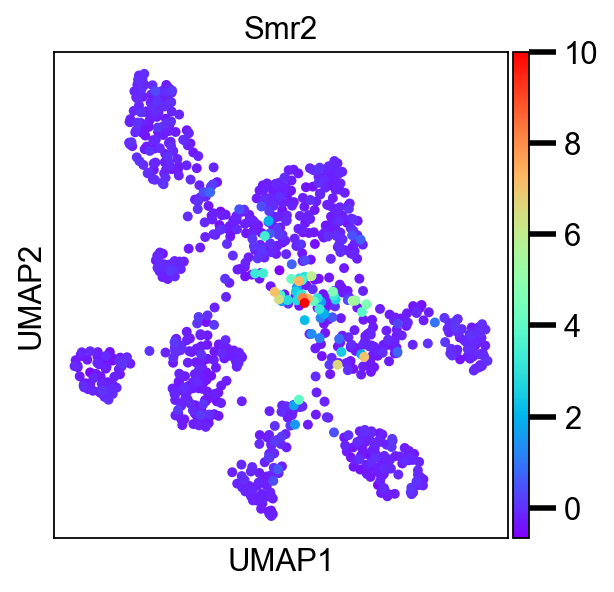

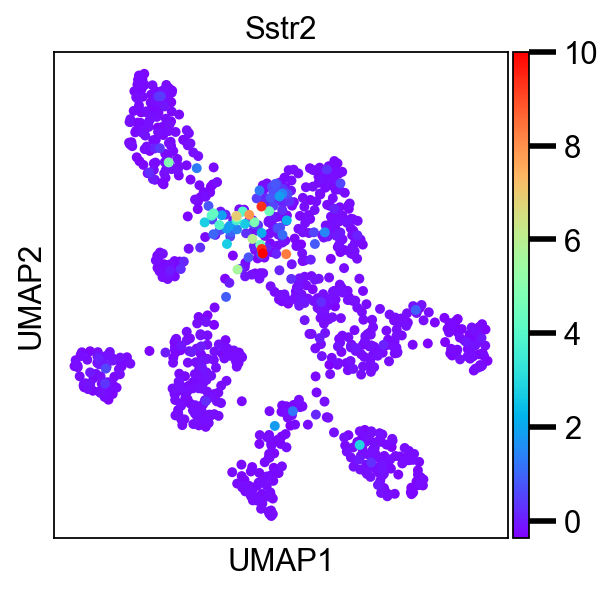

...

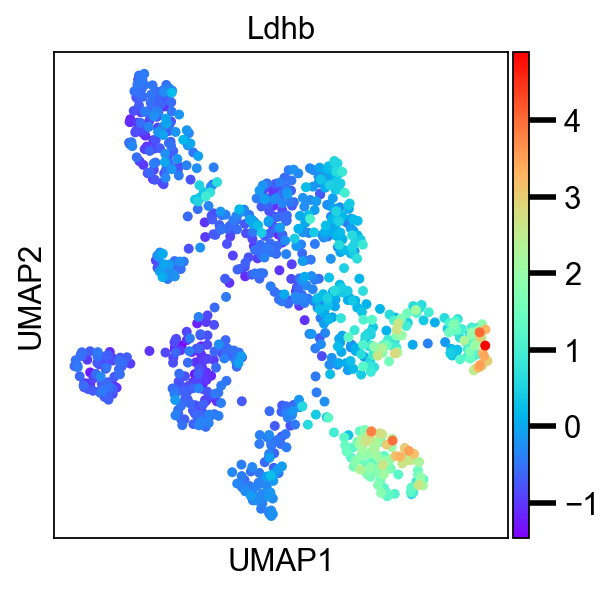

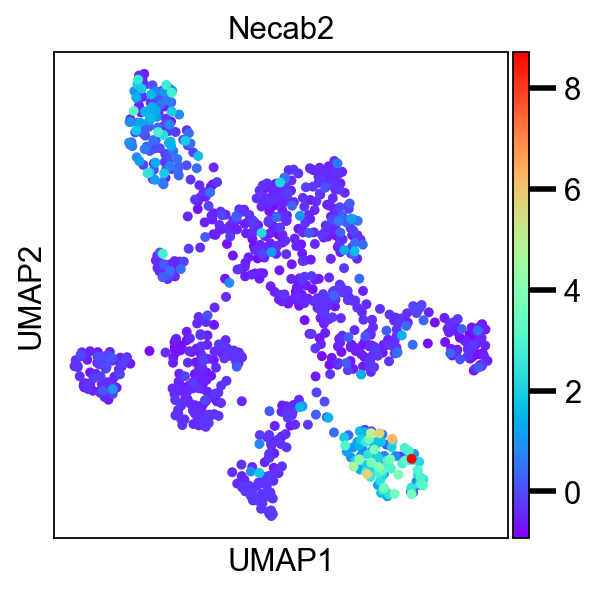

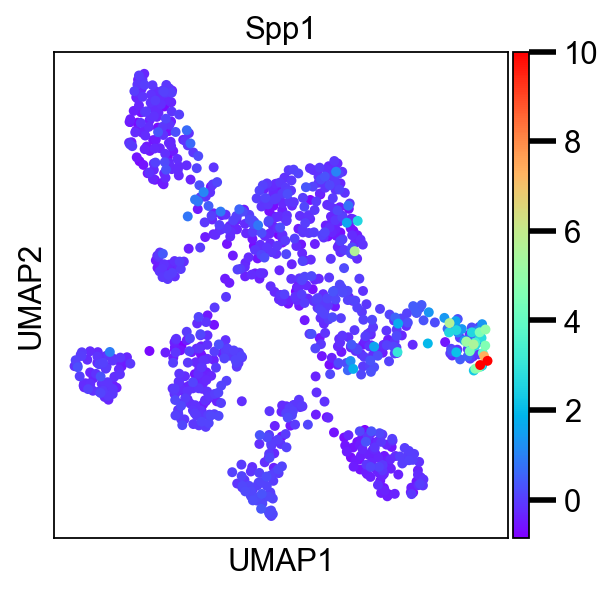

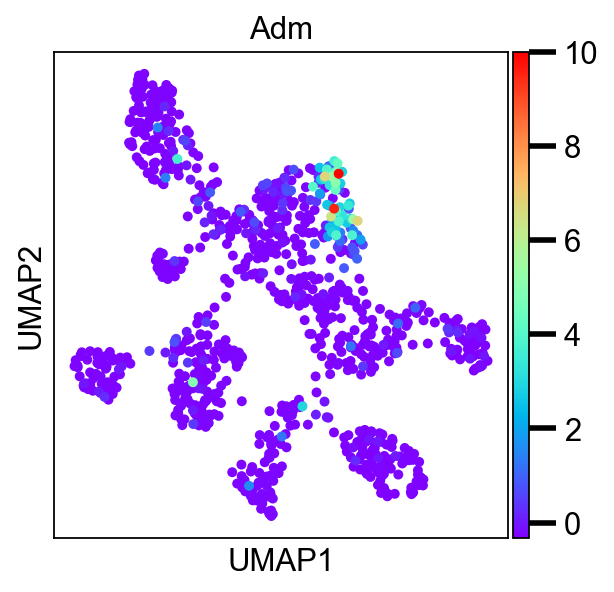

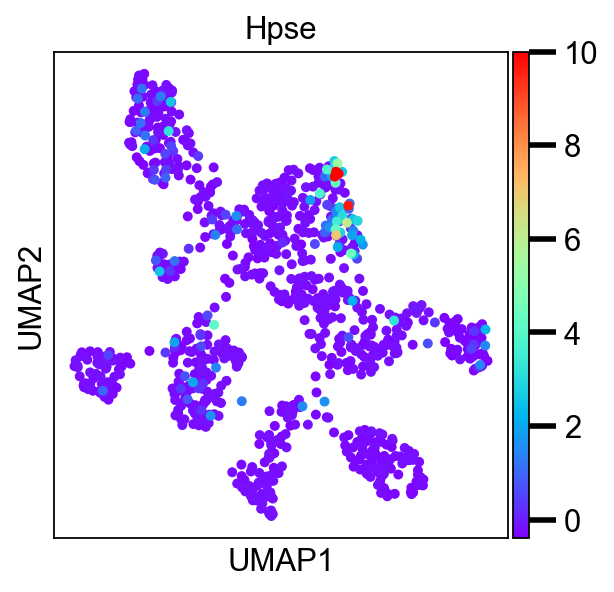

In [12]:
### Run plotting umap with color code according to gene expression
rcParams['figure.figsize']=(4,4)

np.in1d(marker_genes, adata.var_names)
for gene in marker_genes:
    sc.pl.umap(adata=adata, color=gene, use_raw=False, cmap = 'rainbow',save = '_expression_genes_' + gene + '.png', size = 80)
    

## EXPORT DATA FOR MATLAB

Now we add the information we have about stimuli for each cell and level of campari green and red fluorecence. 

Here we define the stimuli that were used (this assignation of number and id is the one that is used in the plate information excel sheet): 


* 0: control
* 1: pinch
* 2: new_stroke (after december)
* 3: ballon
* 4: AG (ano-genital brush)
* 5: AD (anal distension)
* 6: heating
* 7: mock
* 8: old_stoke (first experiments with stroke)
* 9: anal pinch
* 10: mock with poop
* 11: tomatoe
* 12: poop

In [13]:
len(adata.var['gene_name'])

25990

In [14]:
#################################################################################
#################################################################################
#################################################################################
#################### HERE WE EXPORT ALL THE INFORMATION AS .MAT ################

### we export sparse data matrix, stimuli and flourecence information, umap transformation information and
### louvain transformation

### create and exportable varable list of genes names
gene_name = []
for i in range(len(adata.var['gene_name'])):
    gene_name.append(adata.var['gene_name'].iloc[i])
    
gene_name_all = []
for i in range(len(adata_all.var['gene_name'])):
    gene_name_all.append(adata_all.var['gene_name'].iloc[i])
### transform adata sparse matrix to scipy
x_all = adata_all.X
x = adata.X
### create exportable arrays with information about stimuli, fluorecence, and louvain transformations
stim = np.zeros((x.shape[0],))
red = np.zeros((x.shape[0],))
green = np.zeros((x.shape[0],))
louvain = np.zeros((x.shape[0],len(louvain_names)))
for i in range(x.shape[0]):
    stim[i] = adata.obs['stimulus'][i]
    red[i] = adata.obs['red'][i]
    green[i] = adata.obs['green'][i]
    count = 0
    for name in louvain_names:
        louvain[i,count] = adata.obs[name][i]
        count = count + 1
data = {'umap': adata.obsm['X_umap'],'gene_name' : np.array(gene_name_all),'gene_name_matrix' : np.array(gene_name),'sparse_matrix': x_all,'matrix': x,'stimuli':stim,
        'red_intesity': red, 'green_intensity': green, 'louvain' : louvain, 'louvain_name': louvain_names}

scipy.io.savemat(matlab_matrix_path, data)

#################################################################################
#################################################################################
#################################################################################

In [15]:
# we reload the original data before pca and umap
adata = ad.read_h5ad(adata_path)

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\anndata\_core\anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of campari cells =  521
Number of control cells =  468
computing PCA
    on highly variable genes
    with n_comps=15
    finished (0:00:00)
computing PCA
    on highly variable genes
    with n_comps=15


c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\anndata\_core\anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


    finished (0:00:00)


c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\anndata\_core\anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


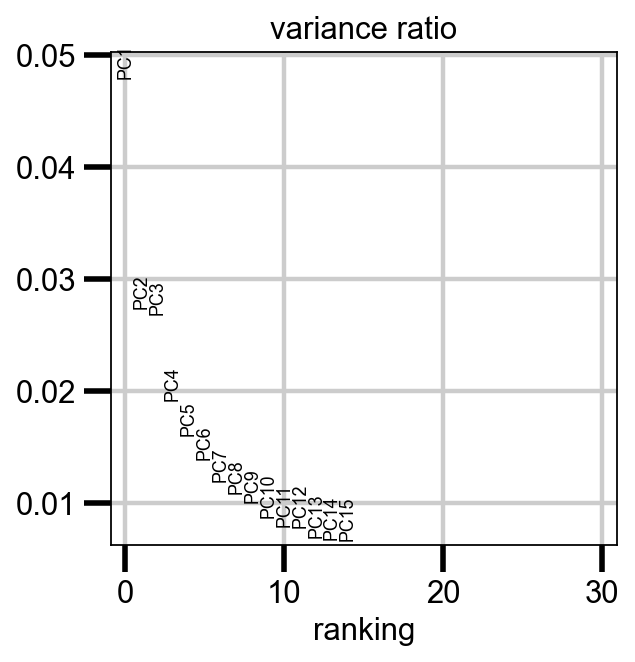

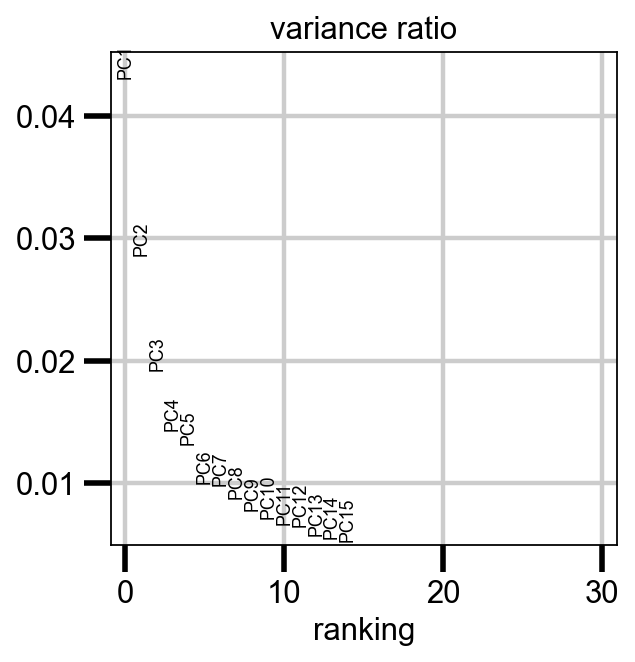

In [16]:
campari_cells = np.where(stim != 0)[0]
control_cells = np.where(stim == 0)[0]

print('Number of campari cells = ', len(campari_cells))
print('Number of control cells = ', len(control_cells))

adata_campari = adata[campari_cells,:]
adata_control = adata[control_cells,:]

### Dimentionality reduction examples using multiple techniques
### Select one number of componets, for example n = 15 and do louvain in the umap transformation 
# with that number of componets (we use the same number of components that was previously selected)
N_selected = NO_PCA
sc.pp.pca(adata_campari, n_comps=N_selected, use_highly_variable=True, svd_solver='arpack')
sc.pp.pca(adata_control, n_comps=N_selected, use_highly_variable=True, svd_solver='arpack')

rcParams['figure.figsize']=(4,4)
sc.pl.pca_variance_ratio(adata_campari)
sc.pl.pca_variance_ratio(adata_control)

In [17]:
sc.pp.neighbors(adata_campari)
sc.tl.tsne(adata_campari)
sc.tl.umap(adata_campari)

sc.pp.neighbors(adata_control)
sc.tl.tsne(adata_control)
sc.tl.umap(adata_control)

computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 15
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 15
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


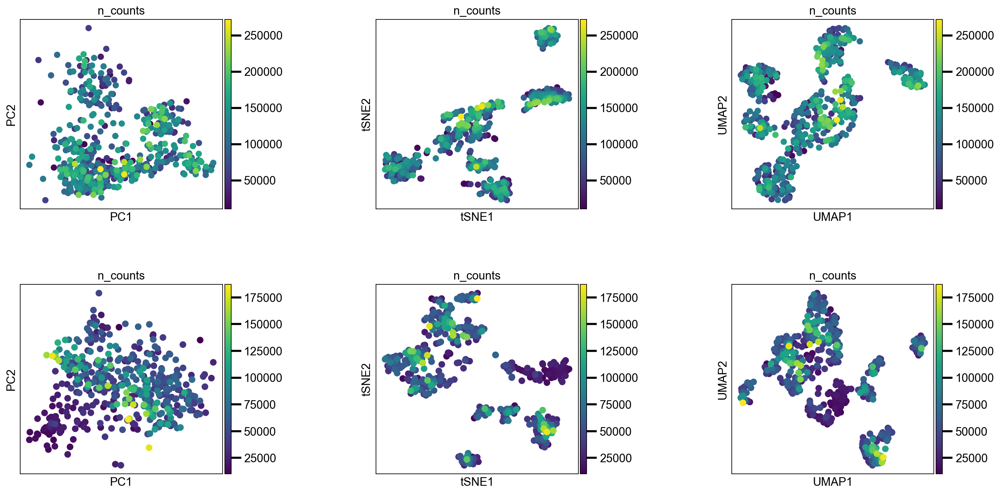

In [18]:
rcParams['figure.figsize']=(20,10)
fig_ind=np.arange(231, 237)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

p10 = sc.pl.pca_scatter(adata_campari, color='n_counts', ax=fig.add_subplot(fig_ind[0]), show=False)
p11 = sc.pl.tsne(adata_campari, color='n_counts', ax=fig.add_subplot(fig_ind[1]), show=False)
p12 = sc.pl.umap(adata_campari, color='n_counts', ax=fig.add_subplot(fig_ind[2]), show=False)
p20 = sc.pl.pca_scatter(adata_control, color='n_counts', ax=fig.add_subplot(fig_ind[3]), show=False)
p21 = sc.pl.tsne(adata_control, color='n_counts', ax=fig.add_subplot(fig_ind[4]), show=False)
p22 = sc.pl.umap(adata_control, color='n_counts', ax=fig.add_subplot(fig_ind[5]), show=False)

plt.show()

In [19]:
umap_path = os.path.join(input_path, campari_umap_file)
adata_umap = ad.read_h5ad(umap_path)

c:\Users\ilosz01\.conda\envs\scs\lib\site-packages\anndata\_core\anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [20]:
rcParams['figure.figsize']=(4,4)

labels=['Control','pinch','new_stroke','ballon','AG','AD','heating','mock','old_stroke','anal_pinch','mock_w_poop','vaginal_distension','tomatoe','poop']
color = ['gainsboro','green','darkorange','purple','magenta','cyan','red','orange','yellow','brown','orange','blue','violet','k']


### create and exportable varable list of genes names
gene_name = []
for i in range(len(adata_umap.var['gene_name'])):
    gene_name.append(adata_umap.var['gene_name'].iloc[i])
### transform adata sparse matrix to scipy
x = adata_umap.X
### create exportable arrays with information about stimuli, fluorecence, and louvain transformations
stim = np.zeros((x.shape[0],))
red = np.zeros((x.shape[0],))
green = np.zeros((x.shape[0],))
for i in range(x.shape[0]):
    stim[i] = adata_umap.obs['stimulus'][i]
    red[i] = adata_umap.obs['red'][i]
    green[i] = adata_umap.obs['green'][i]


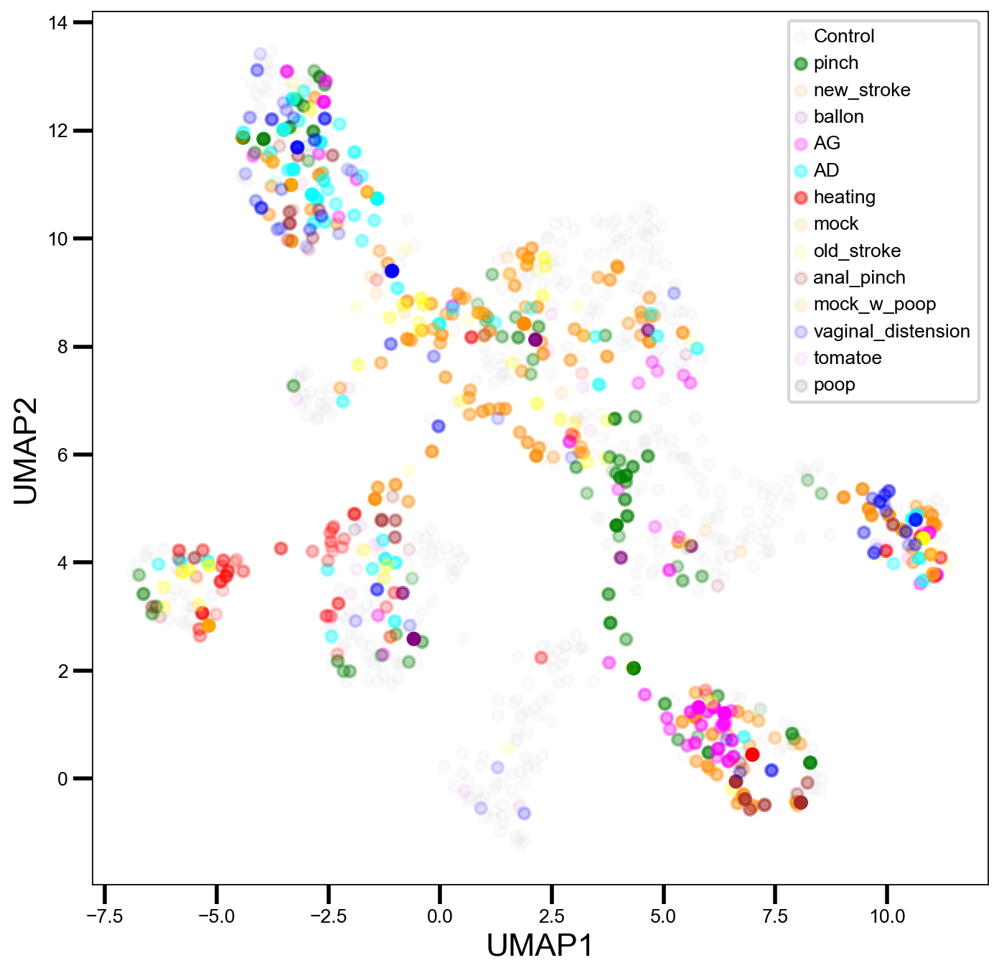

In [21]:
### plotting all stimulus together

figure, axes = plt.subplots()
#red_norm = (red - np.min(red)) / (np.max(red) - np.min(red))
for i in range(len(labels)):
    index = np.where(stim == i)[0]
    red_norm = (red[index] - np.min(red[index])) / (np.max(red[index]) - np.min(red[index]) + sys.float_info.epsilon)
    red_norm = (red_norm + 0.1)/1.1
    axes.scatter(adata_umap.obsm['X_umap'][index,0],adata_umap.obsm['X_umap'][index,1], s = 50, c = color[i], alpha = red_norm)
axes.grid(visible = 'None')
#axes.set_xlim([0,19])
#axes.set_ylim([0,19])
axes.set_xlabel('UMAP1', fontsize = 20)
axes.set_ylabel('UMAP2', fontsize = 20)
axes.tick_params(axis='both', which='major', labelsize=12)
axes.tick_params(axis='both', which='minor', labelsize=12)
axes.grid(False)

axes.legend(labels, fontsize = 12)
#sc.pl.umap(adata, color = 'stimulus', color_map = 'Set1', save = 'stimulus'+ '.png', size = 180)
figure.set_size_inches([10,10])
figure.savefig(os.path.join(figure_path, 'stimulus.png'))

(541, 25990)


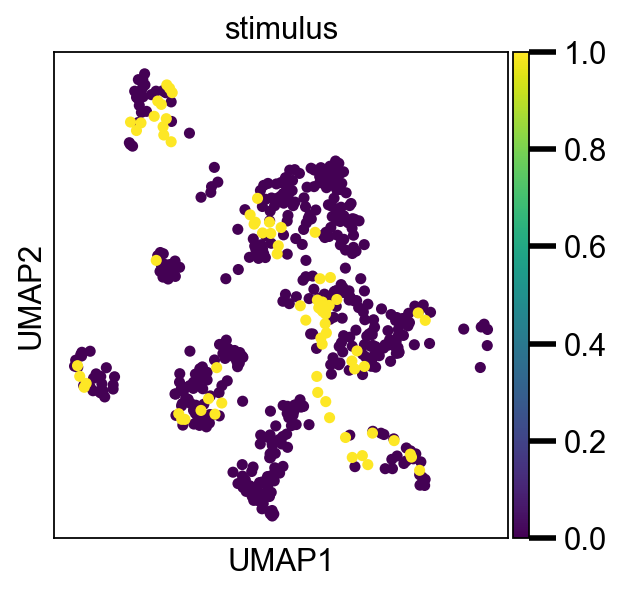

(586, 25990)


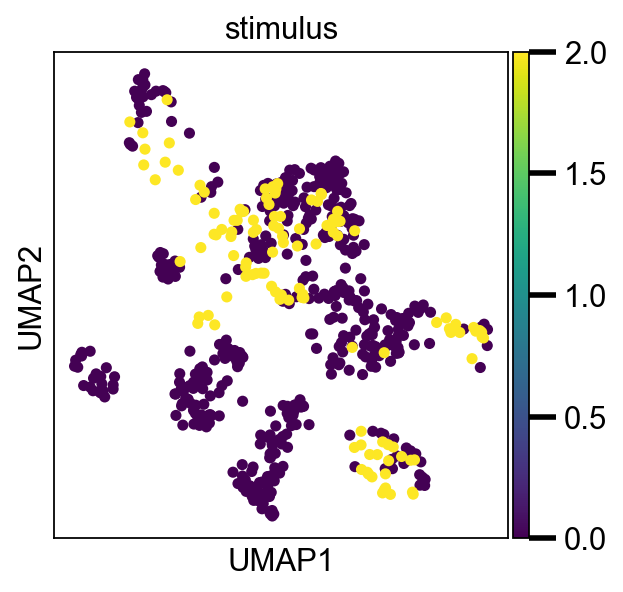

(475, 25990)


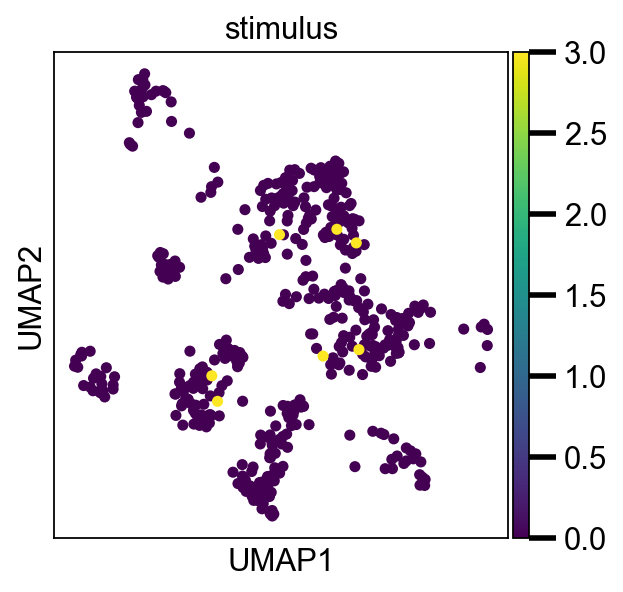

(515, 25990)


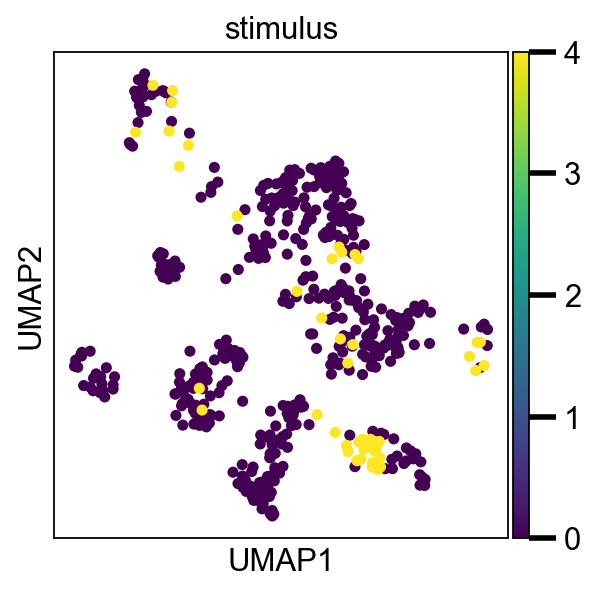

(521, 25990)


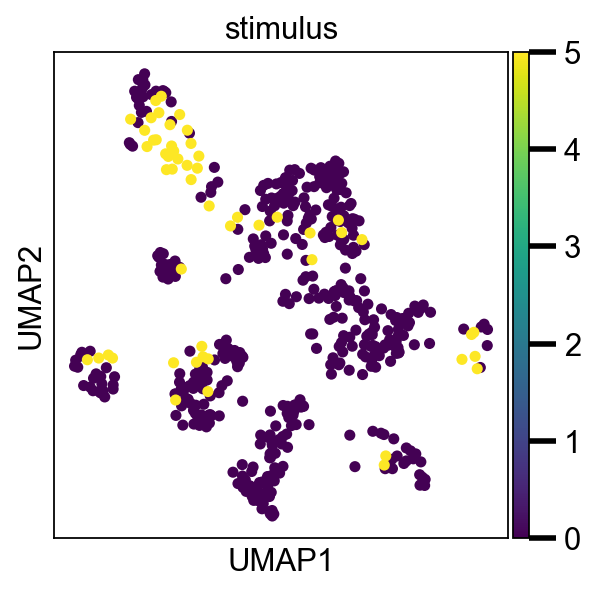

(517, 25990)


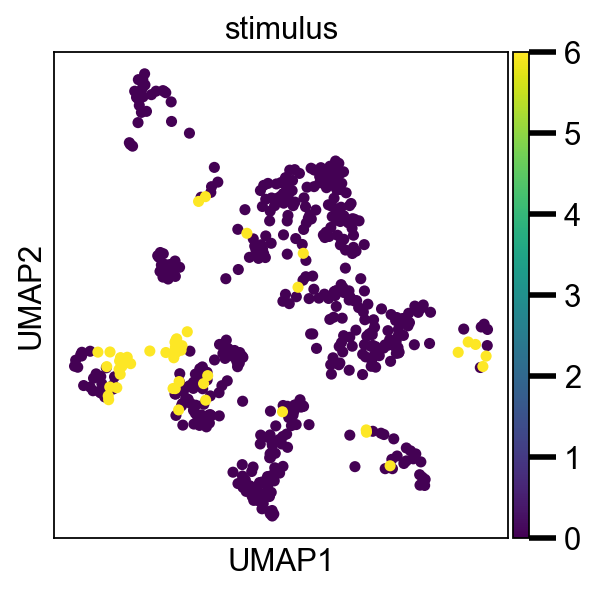

(482, 25990)


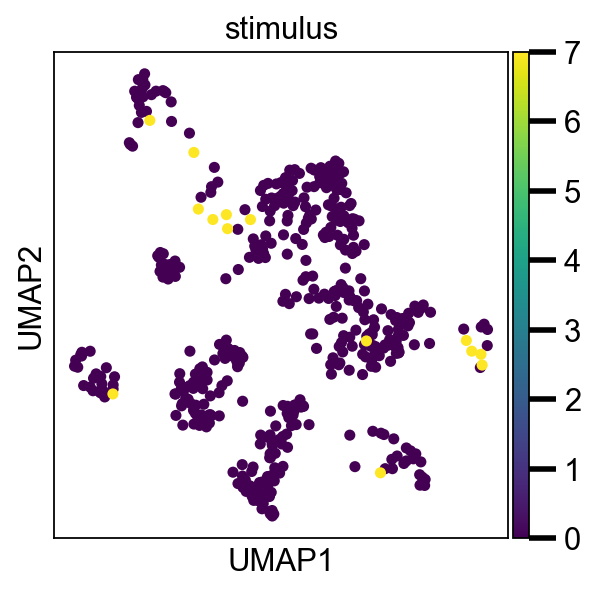

(520, 25990)


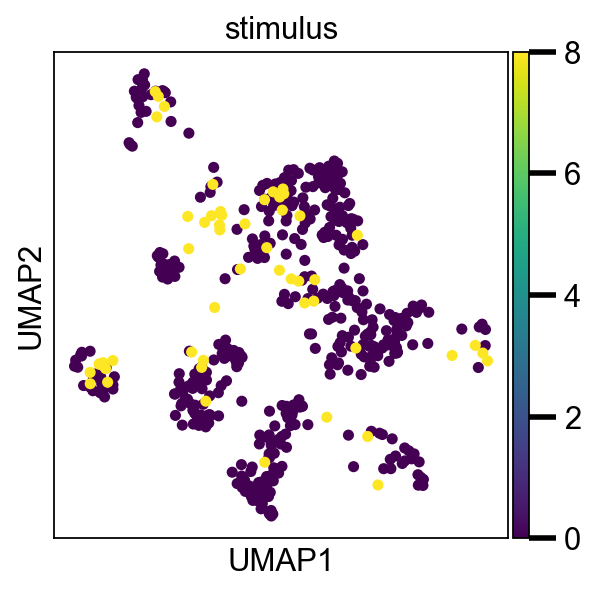

(498, 25990)


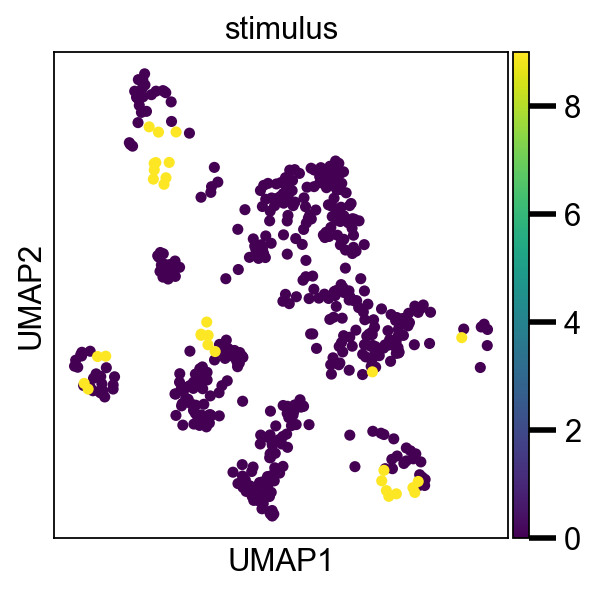

(472, 25990)


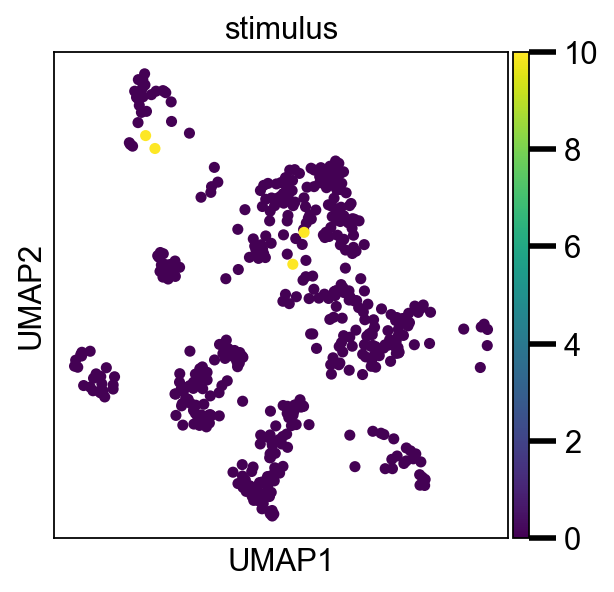

(520, 25990)


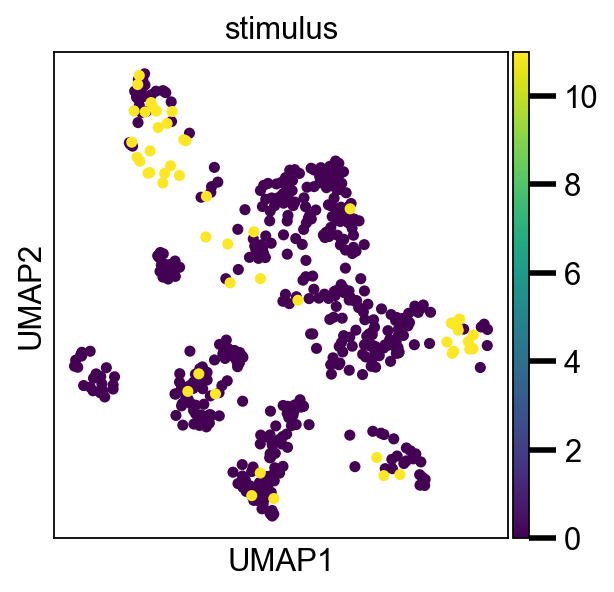

(489, 25990)


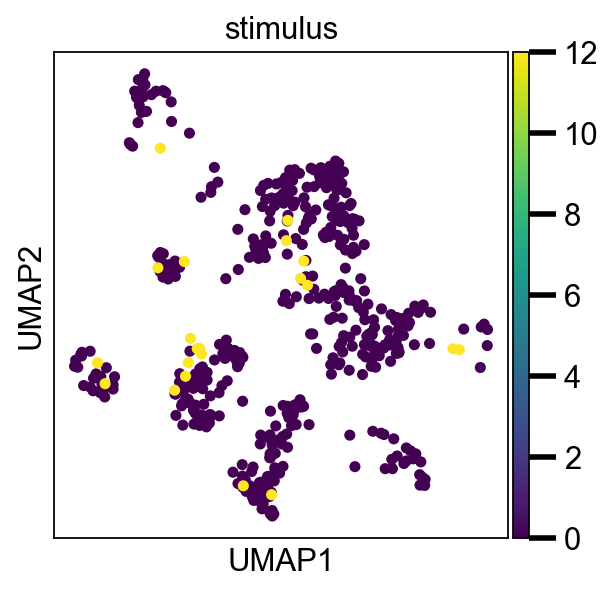

(469, 25990)


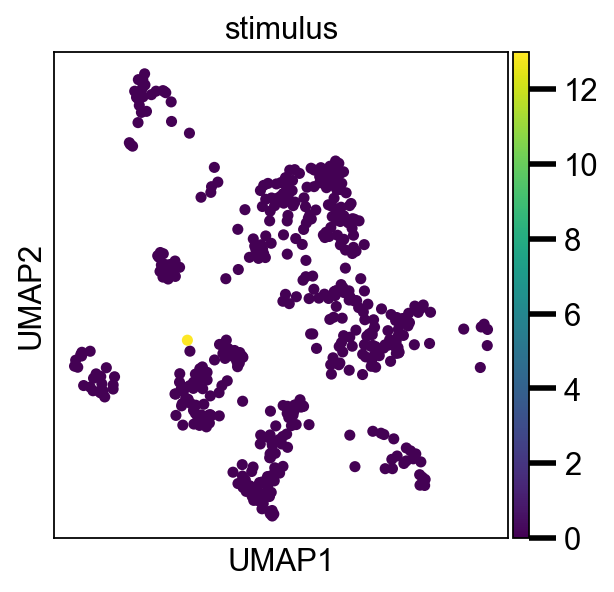

In [22]:
### plotting stimuli individualy

rcParams['figure.figsize']=(4,4)

for i in range(1,14):
    index = np.logical_or(adata_umap.obs['stimulus'] == i,adata_umap.obs['stimulus'] == 0)
    aux_adata = adata_umap[index,:]
    print(aux_adata.shape)
    sc.pl.umap(aux_adata, color = 'stimulus', color_map = 'viridis', save = '_stimulus_' + labels[i]+ '.png', size = 100)

0
[]
4
[0]
5
[0, 4]
2
[0, 4, 5]
1
[0, 4, 5, 2]
9
[0, 4, 5, 2, 1]
6
[0, 4, 5, 2, 1, 9]
11
[0, 4, 5, 2, 1, 9, 6]
12
[0, 4, 5, 2, 1, 9, 6, 11]


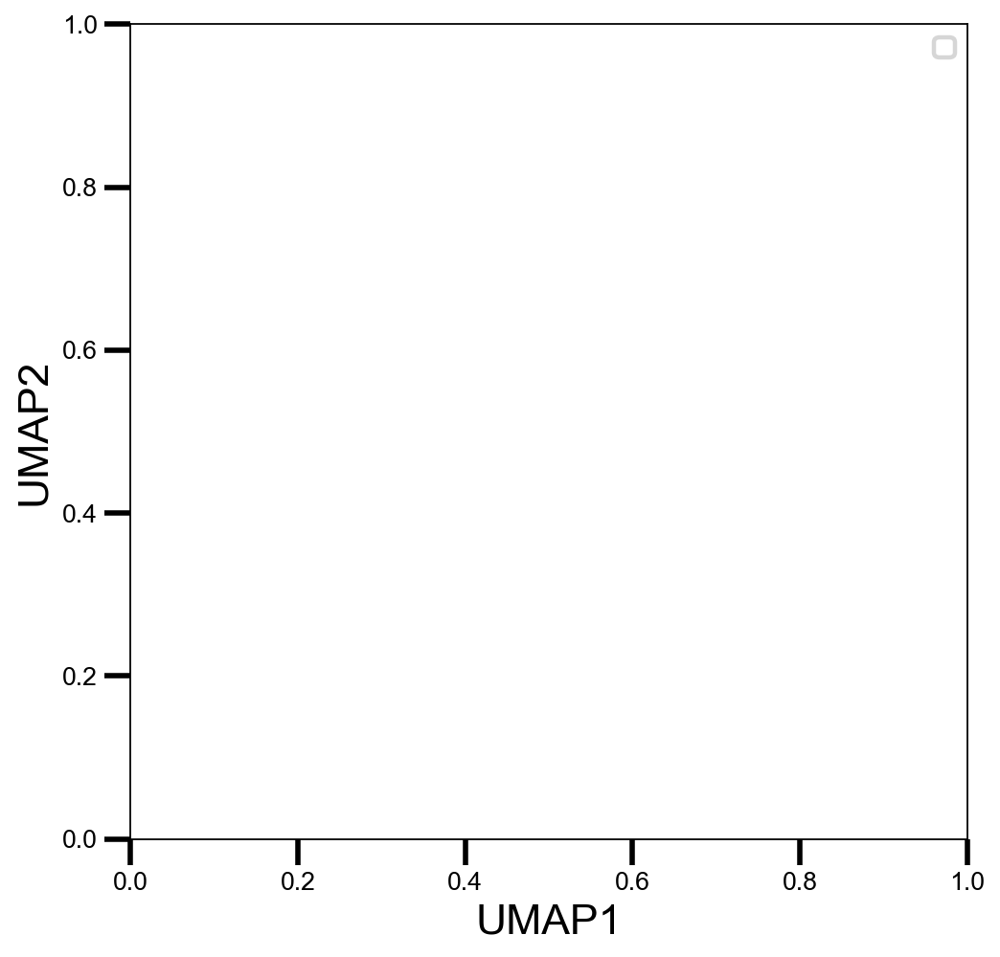

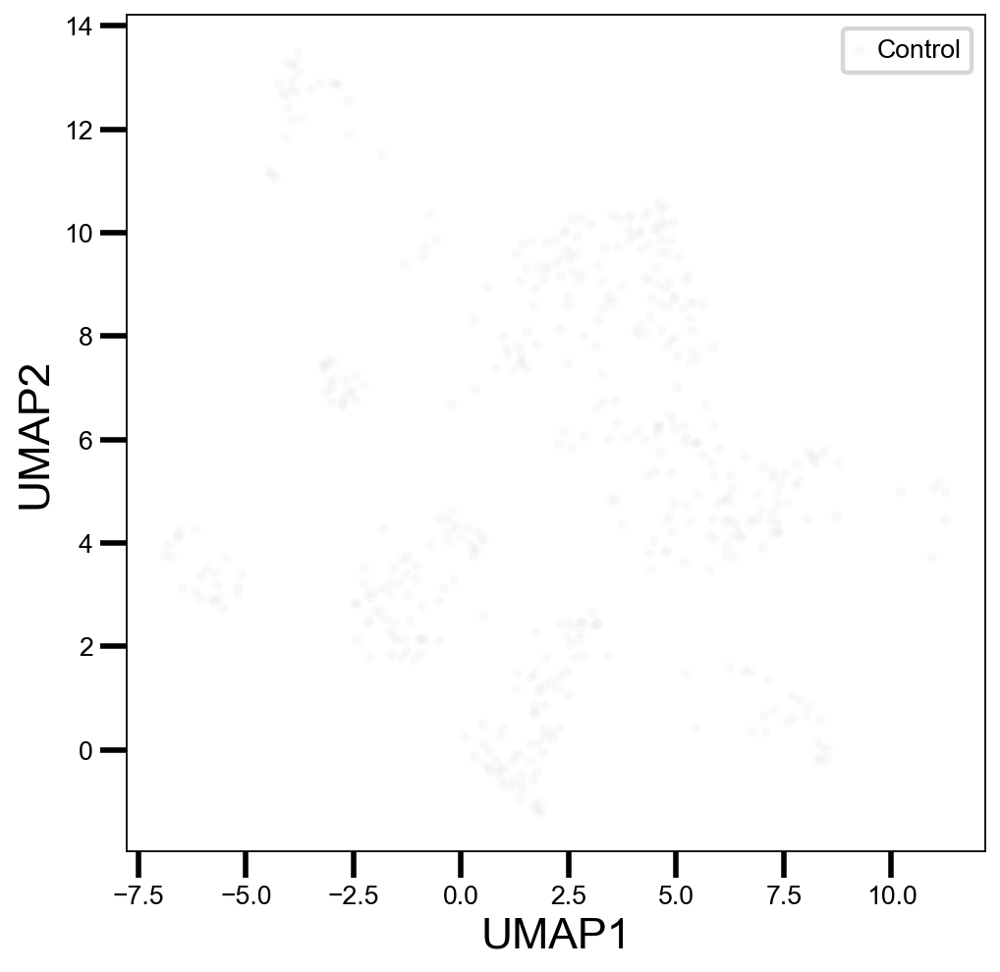

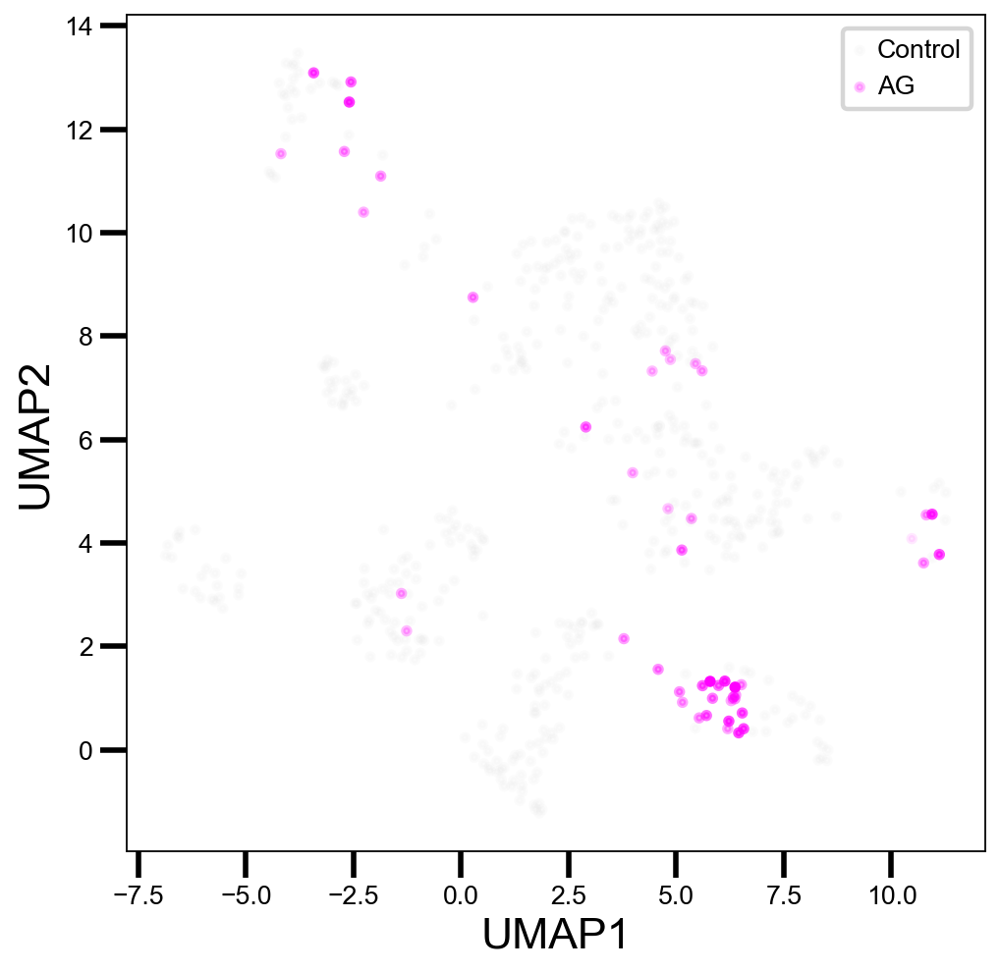

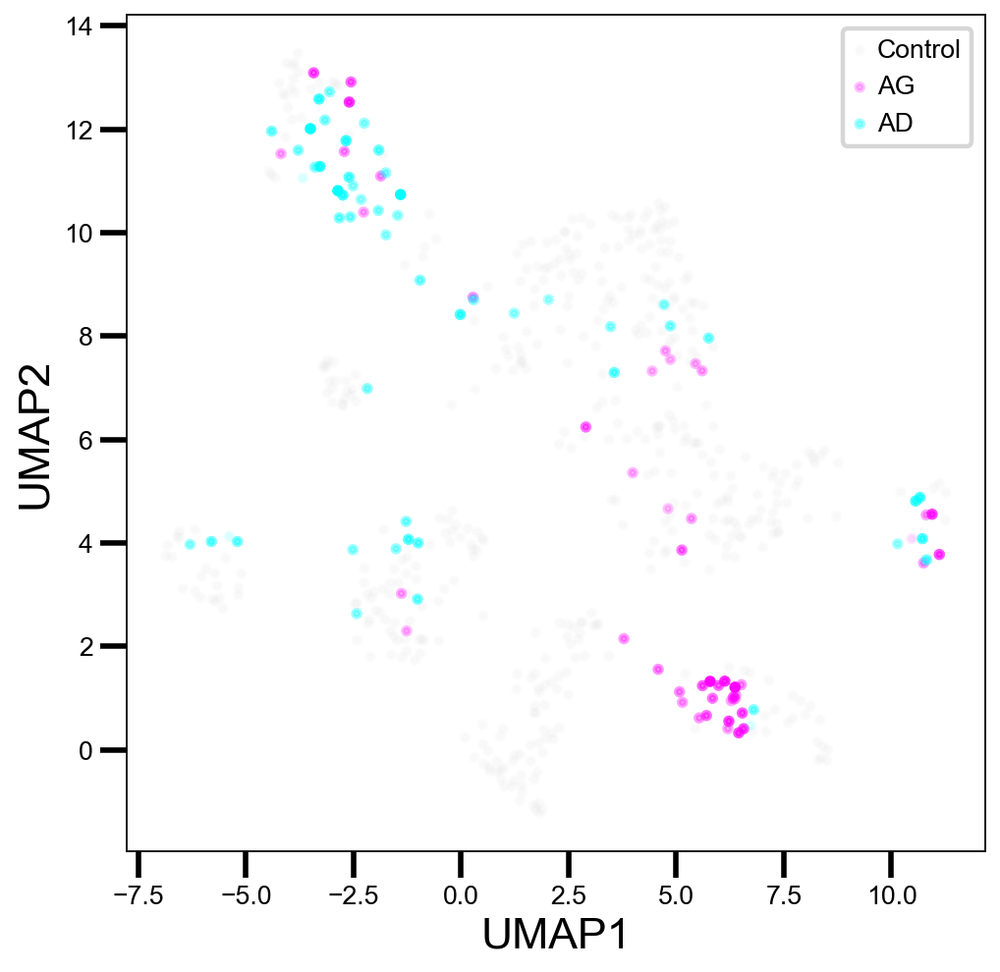

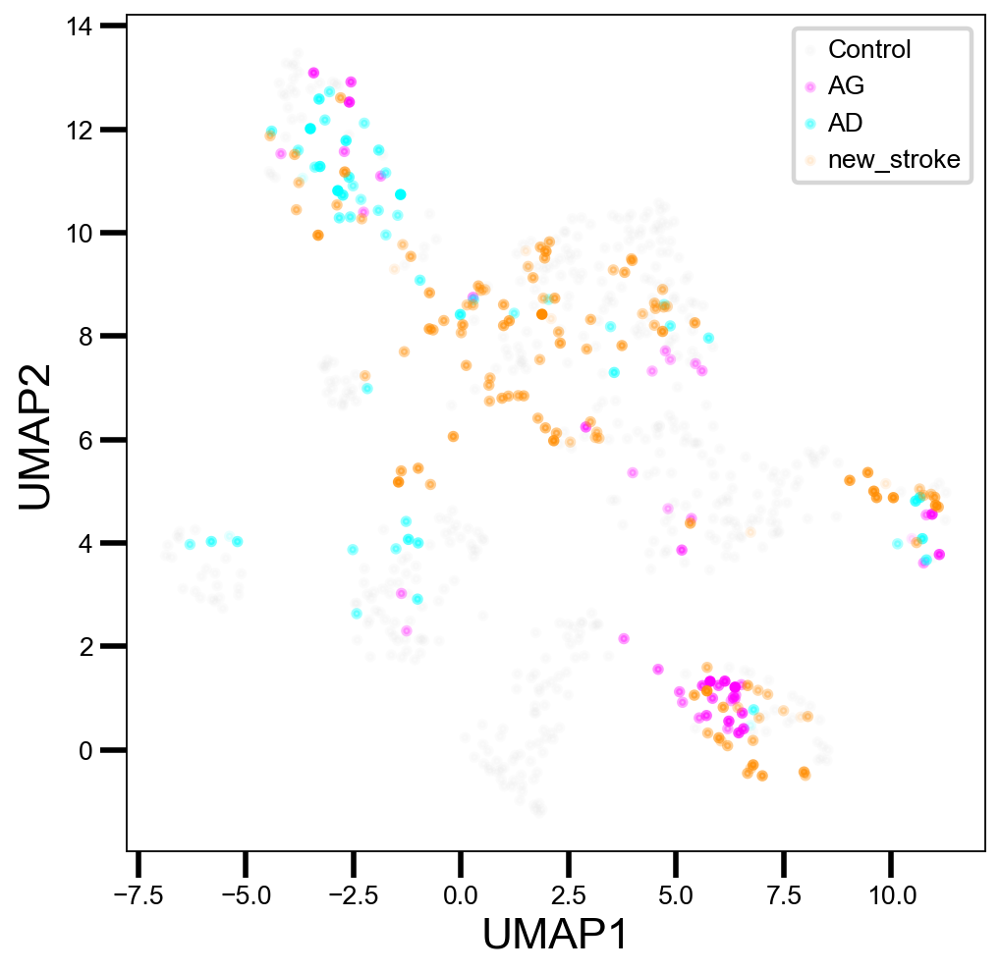

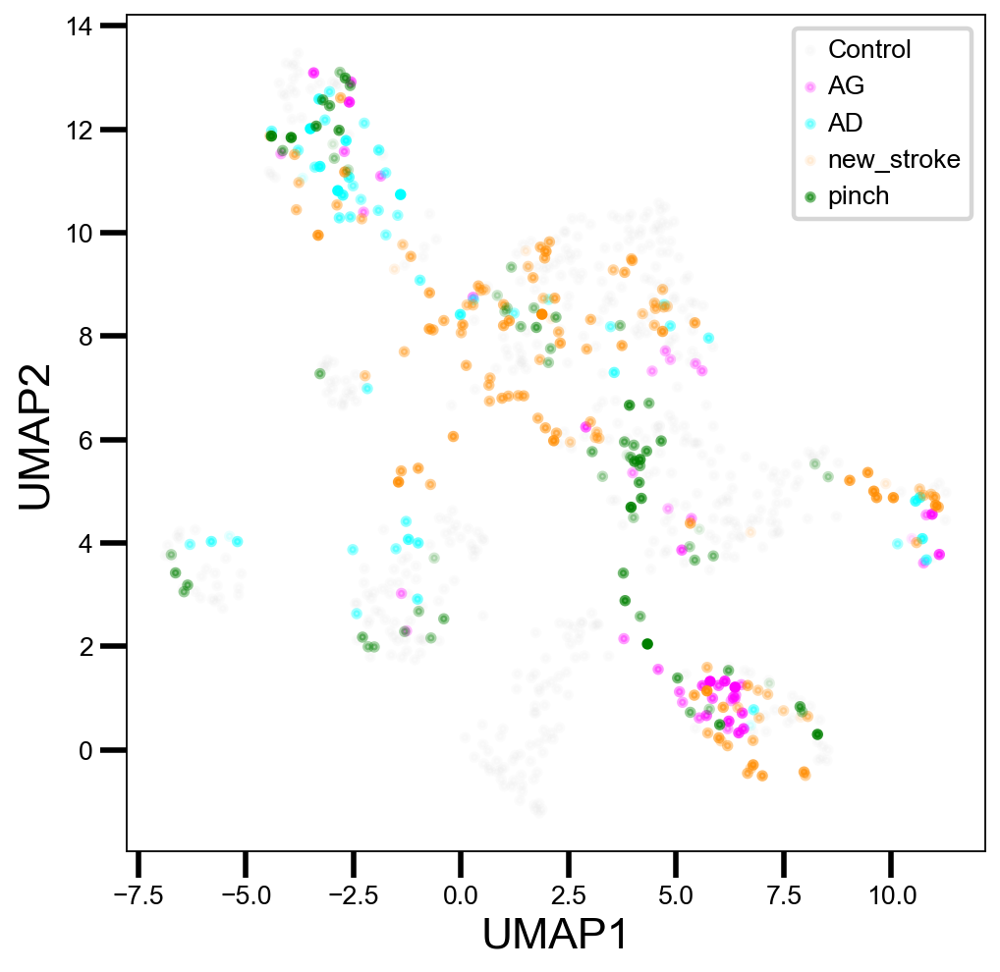

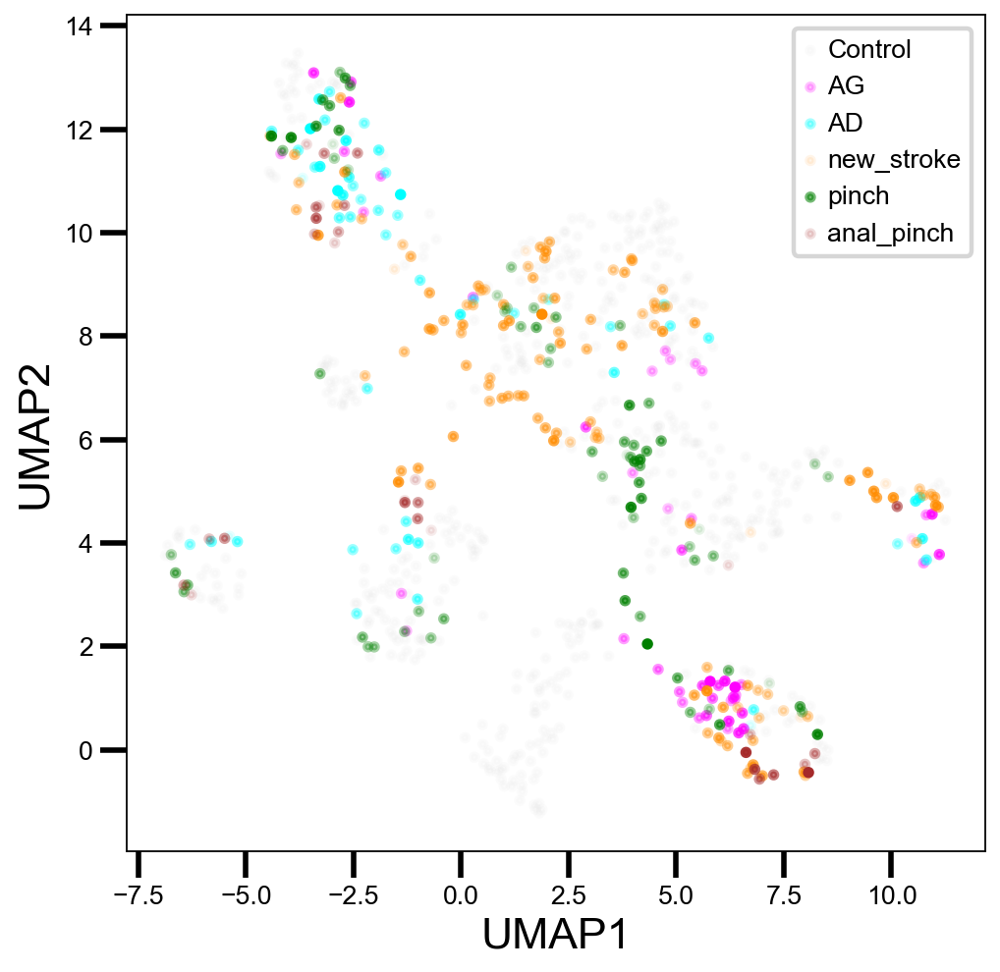

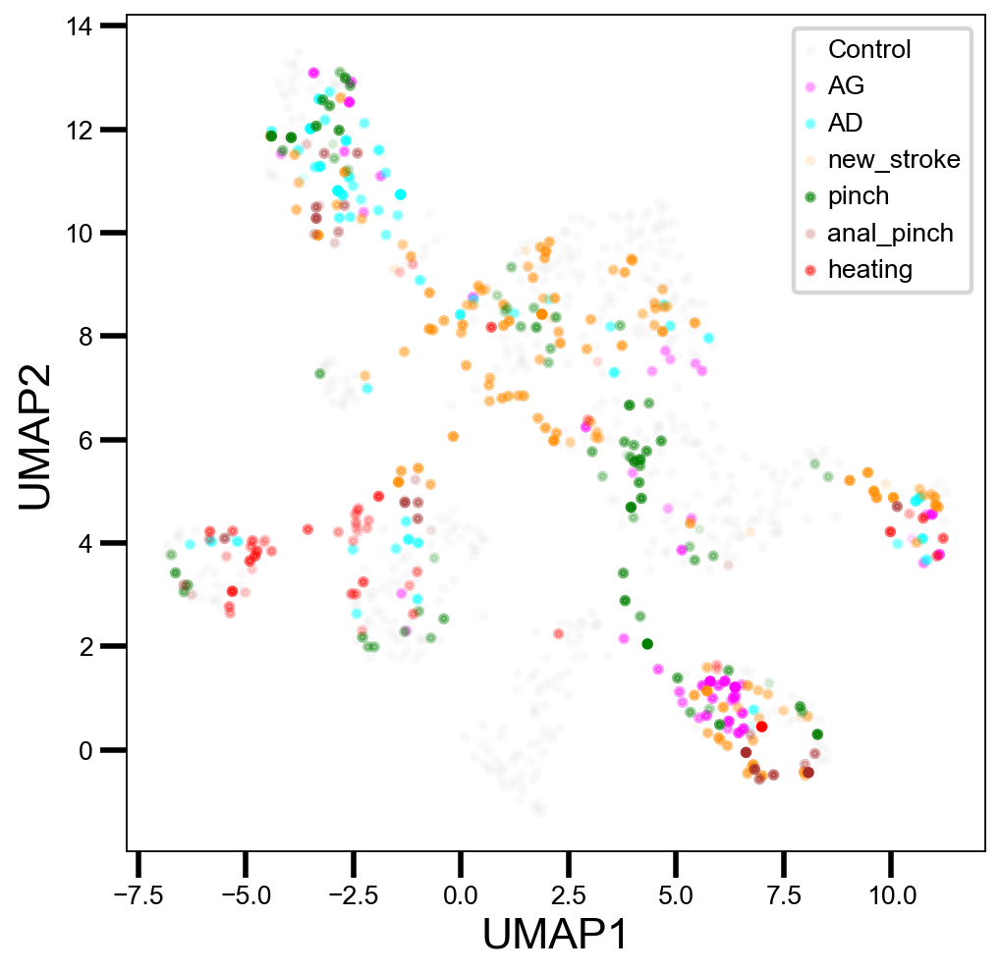

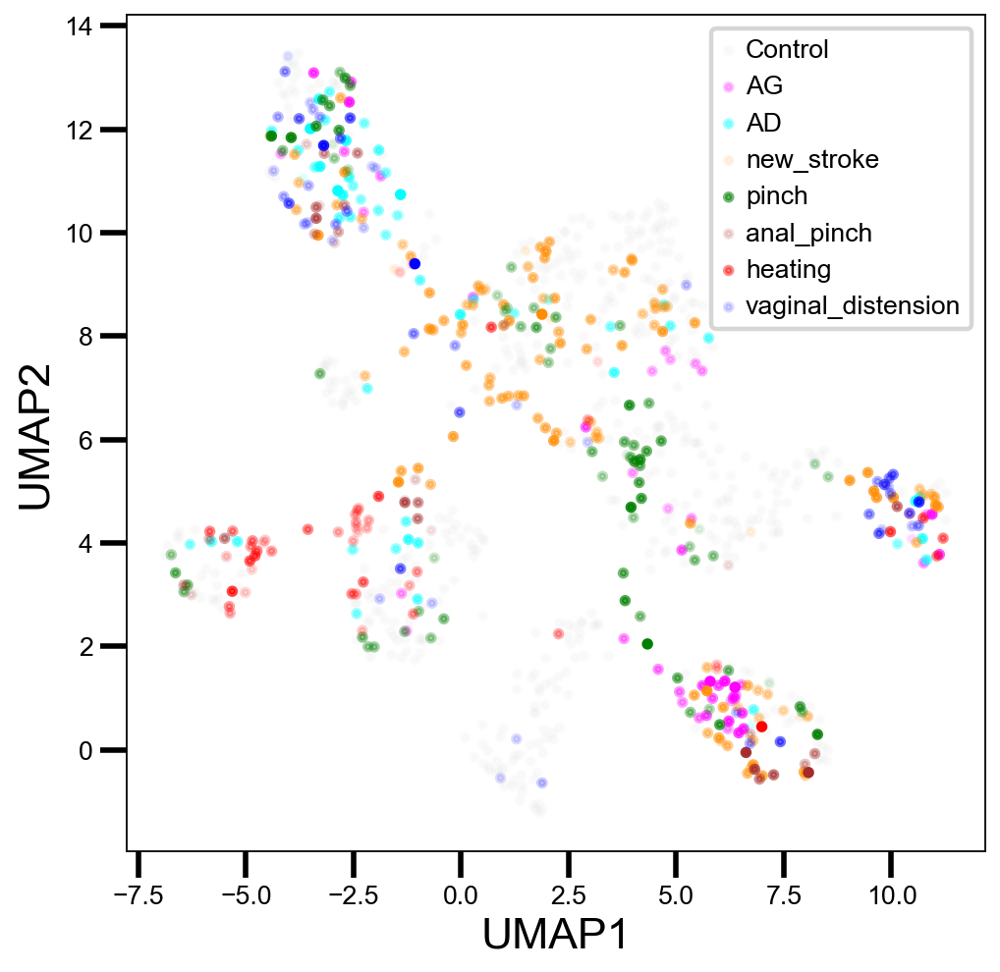

In [23]:
### plotting subsequent stimulus to add individually in a gif (only for selected stimuli)
stimulus_list = [0,4,5,2,1,9,6,11,12]
new_labels=['Control','AG','AD','new_stroke','pinch','anal_pinch','heating','vaginal_distension','non']
count = 0
for i in stimulus_list:
    print(i)
    figure, axes = plt.subplots()
    sublist = stimulus_list[0:count]
    print(sublist)
    for j in sublist:
        index = np.where(stim == j)[0]
        red_norm = (red[index] - np.min(red[index])) / (np.max(red[index]) - np.min(red[index]) + sys.float_info.epsilon)
        red_norm = (red_norm + 0.1)/1.1
        axes.scatter(adata_umap.obsm['X_umap'][index,0],adata_umap.obsm['X_umap'][index,1], s = 10, c = color[j],alpha = red_norm)

    axes.grid(visible = 'None')
    #axes.set_xlim([0,22])
    #axes.set_ylim([0,22])
    axes.set_xlabel('UMAP1', fontsize = 20)
    axes.set_ylabel('UMAP2', fontsize = 20)
    axes.tick_params(axis='both', which='major', labelsize=12)
    axes.tick_params(axis='both', which='minor', labelsize=12)
    axes.grid(False)
    axes.legend(new_labels, fontsize = 12)
    figure.set_size_inches([7,7])
    figure.savefig(os.path.join(figure_path, 'cum_stimulus'+ str(count) +'.png'))

    count = count +1 

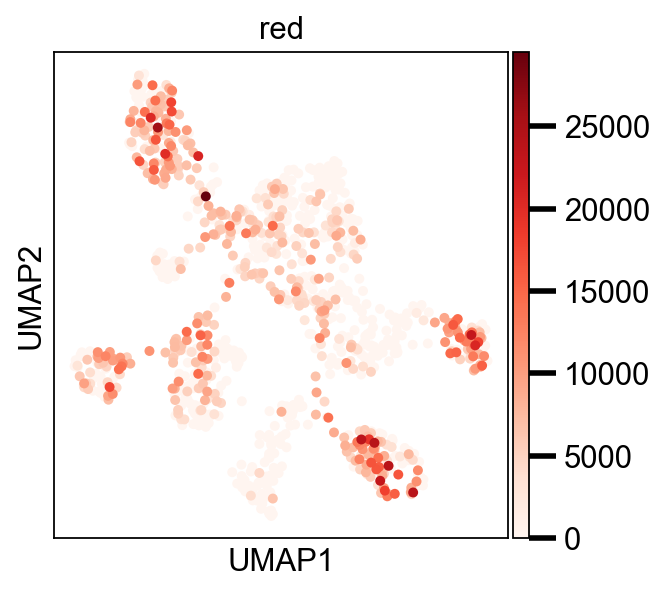

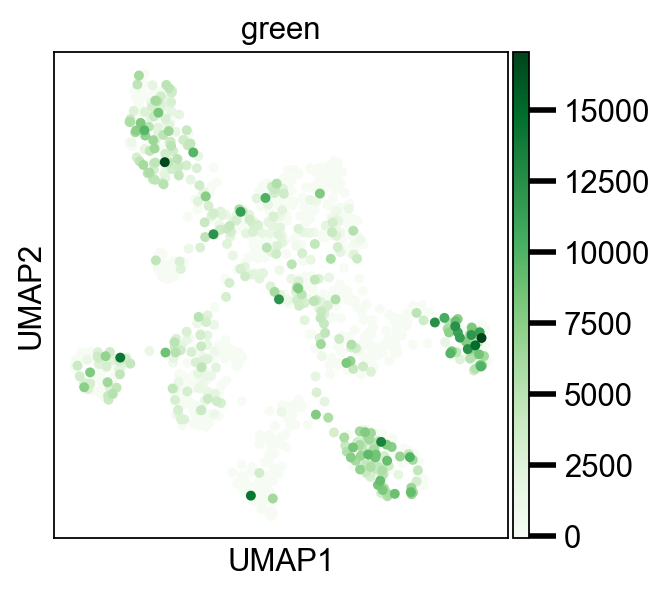

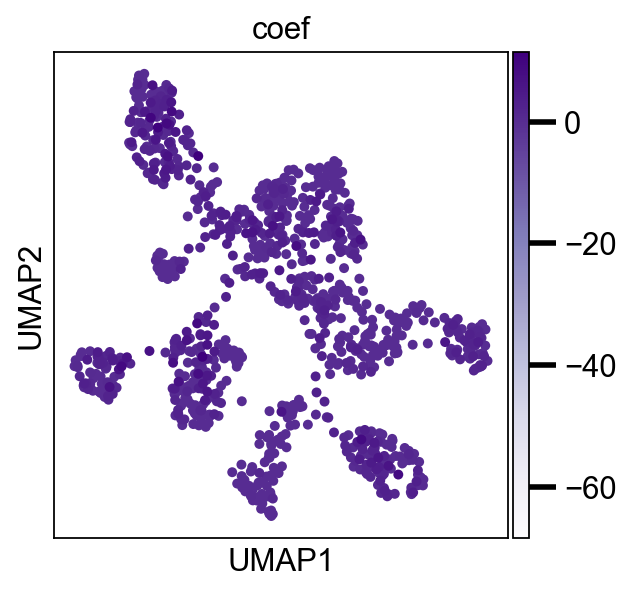

In [24]:
### plotting fluorecence levels 

sc.pl.umap(adata_umap, color='red', color_map = 'Reds', save = '_fluorecence_red_f' + '.png', size = 80)
sc.pl.umap(adata_umap, color='green', color_map = 'Greens', save = '_fluorecence_green_f' + '.png', size = 80)
adata_umap.obs['coef'] = adata_umap.obs['red']/(adata_umap.obs['green'] + sys.float_info.epsilon)
sc.pl.umap(adata_umap, color='coef', color_map = 'Purples', save = '_fluorecence_coef_f' + '.png', size = 80)

(541, 25990)


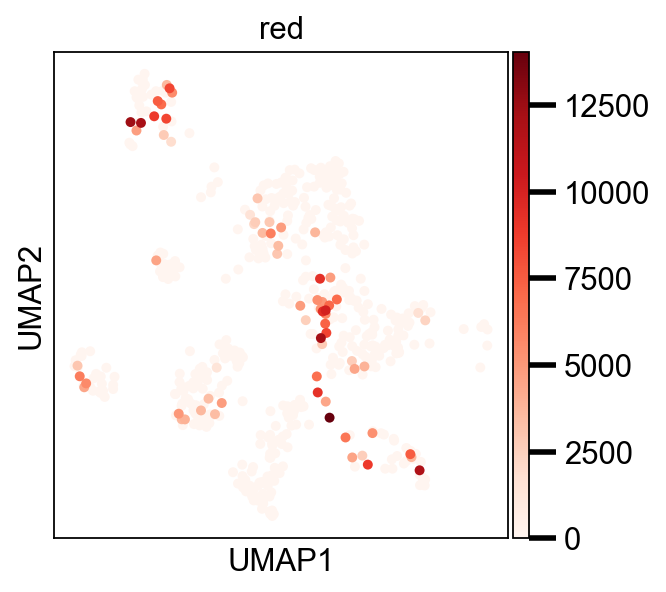

(586, 25990)


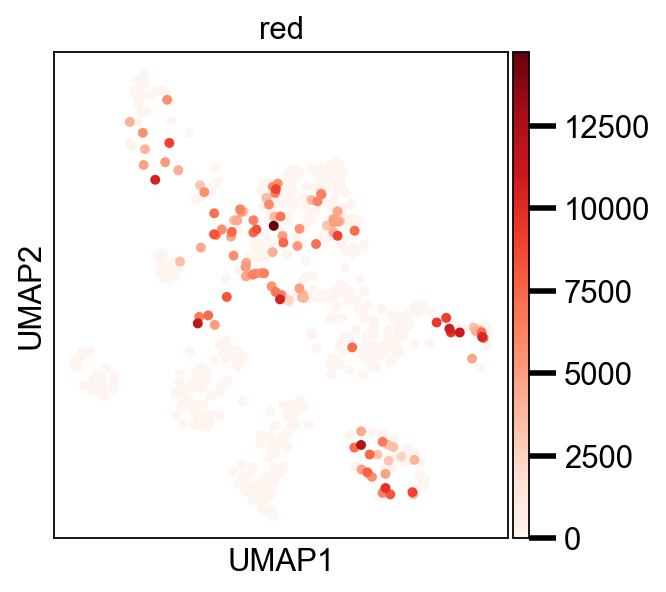

(475, 25990)


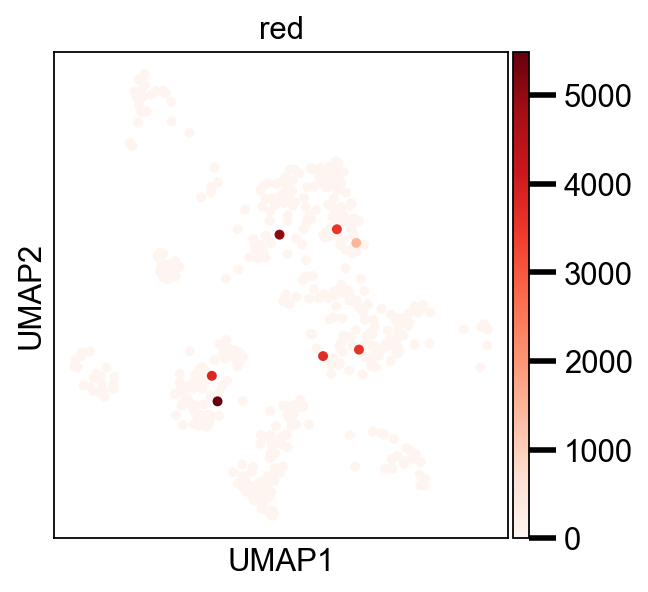

(515, 25990)


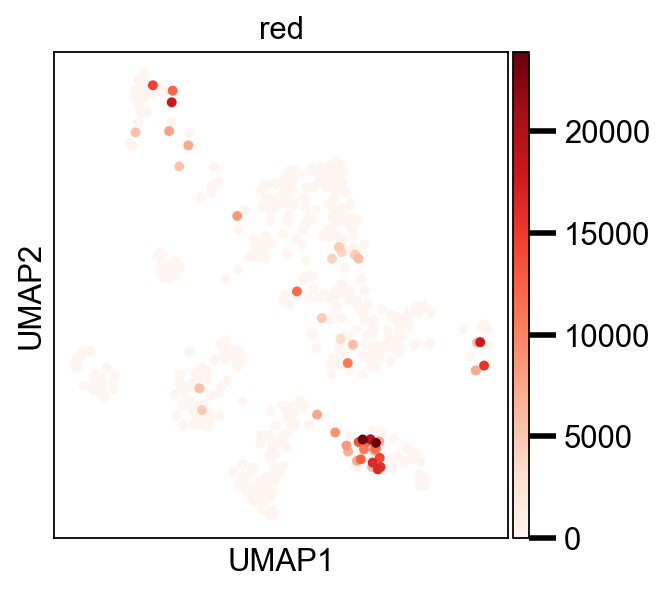

(521, 25990)


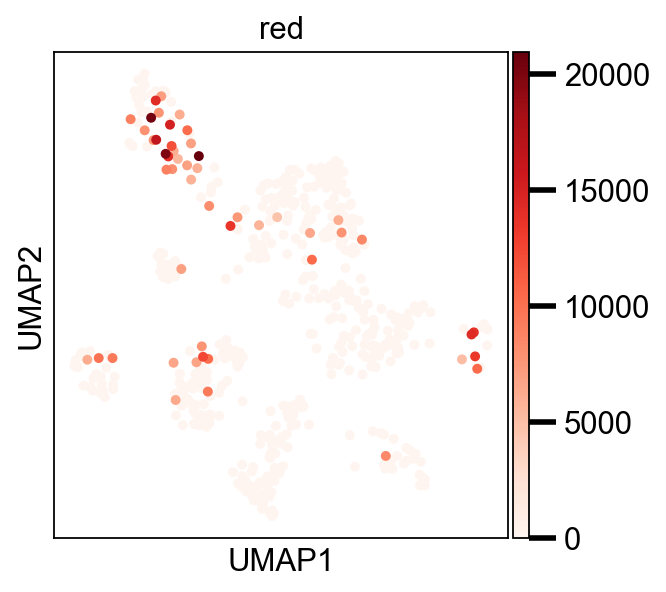

(517, 25990)


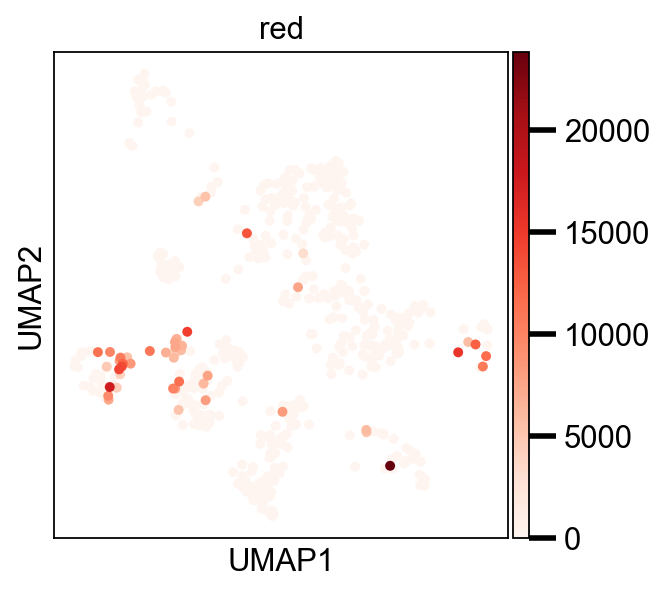

(482, 25990)


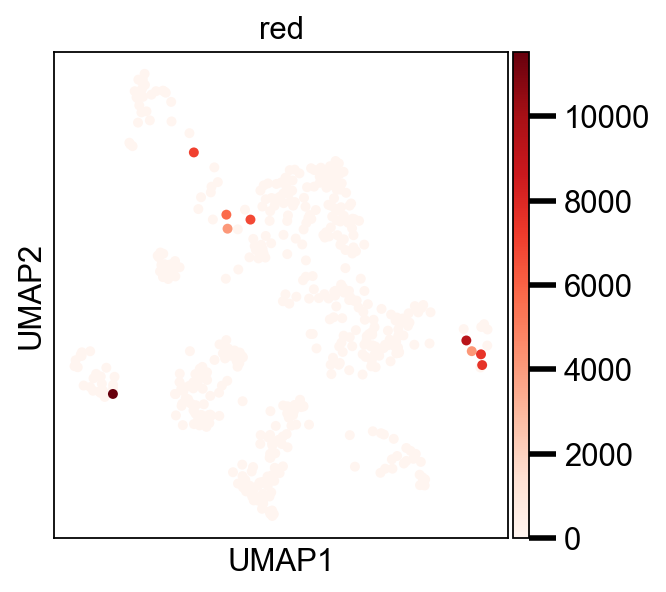

(520, 25990)


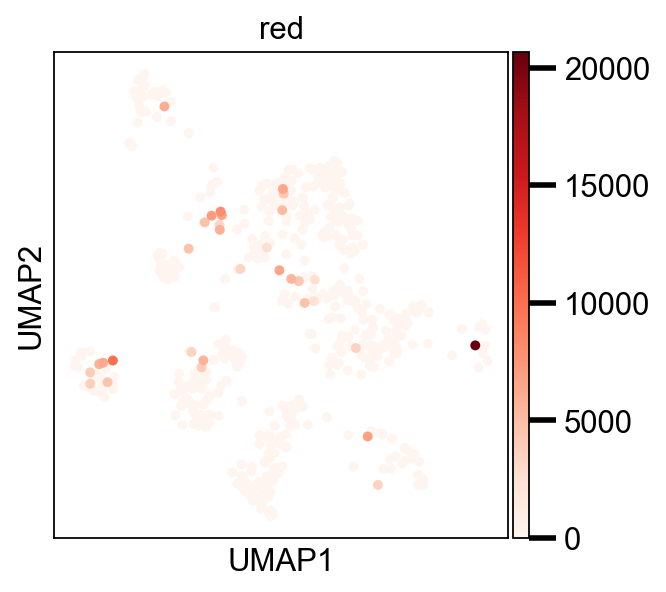

(498, 25990)


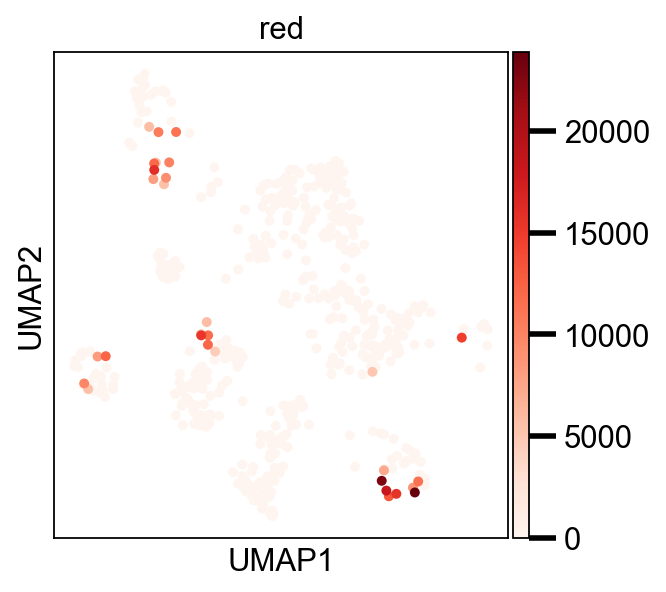

(472, 25990)


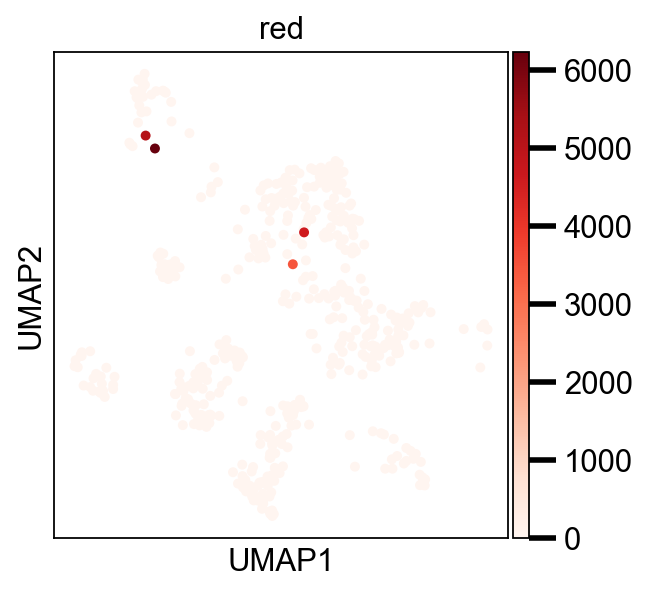

(520, 25990)


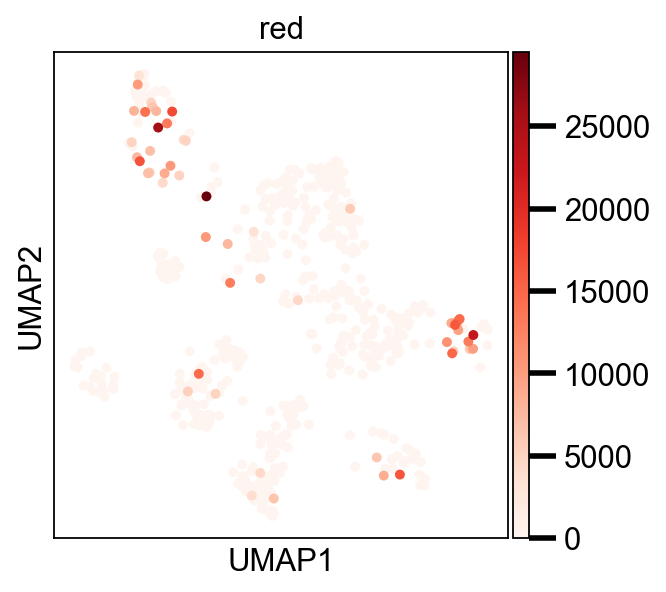

(489, 25990)


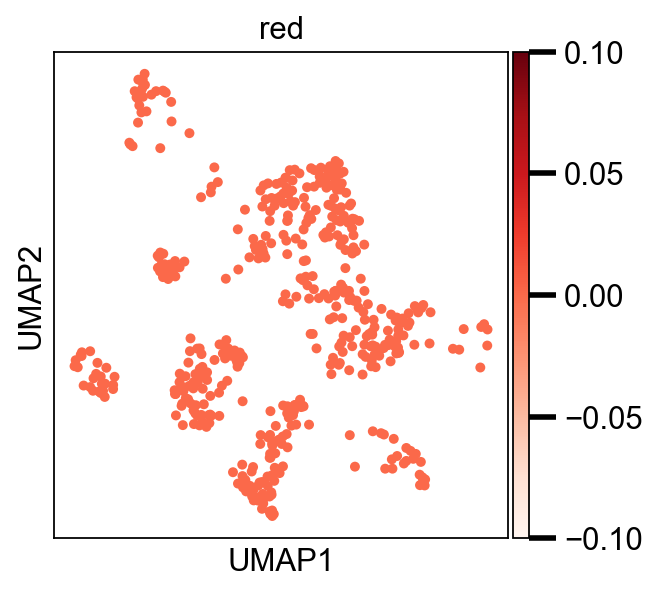

(469, 25990)


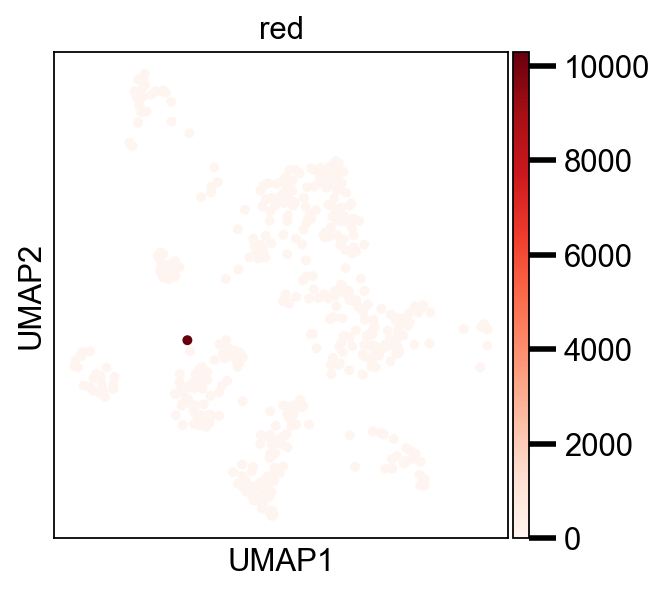

In [25]:
### plotting fluorecence levels stimulus by stimulus
for i in range(1,14):
    index = np.logical_or(adata_umap.obs['stimulus'] == i,adata_umap.obs['stimulus'] == 0)
    aux_adata = adata_umap[index,:]
    print(aux_adata.shape)
    sc.pl.umap(aux_adata, color = 'red', color_map = 'Reds', save = '_fluorecence_stimulus_red_' + labels[i]+ '.png', size = 80)